# EDA - Exploratory Data Analysis

## Librerias a utilizar 

In [1]:
pip install pycoingecko

Note: you may need to restart the kernel to use updated packages.


In [2]:
from pycoingecko import CoinGeckoAPI
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import calendar
import ast
import requests


In [3]:
# Crea una instancia de la clase CoinGeckoAPI
cg = CoinGeckoAPI()

## Ejemplo de llamar una criptomomneda 

In [4]:
# Obtén información sobre una criptomoneda específica (por ejemplo, Bitcoin)
crypto_info = cg.get_coin_by_id(id='bitcoin')

# Imprime la información obtenida
print("ID:", crypto_info['id'])
print("Nombre:", crypto_info['name'])
print("Símbolo:", crypto_info['symbol'])
print("Sitio web:", crypto_info['links']['homepage'][0])
print("Precio actual en USD:", crypto_info['market_data']['current_price']['usd'])

ID: bitcoin
Nombre: Bitcoin
Símbolo: btc
Sitio web: http://www.bitcoin.org
Precio actual en USD: 25817


## Escoger las funcionea a utilizar de CoinGecko 

# Las funciones que use

# Informacion de la criptomomneda 
- cg.get_coins
- cg.get_coins_list
- cg.get_coins_markets
- cg.get_coin_by_id
- cg.get_coin_market_chart_range_by_id
- cg.get_coin_history_by_id
- cg.get_coin_ohlc_by_id

# Categorias
- cg.get_coins_categories
- cg.get_coins_categories_list

# Las que no use
- cg.get_coin_info_from_contract_address_by_id
- cg.get_coin_market_chart_by_id
- cg.get_coin_market_chart_from_contract_address_by_id
- cg.get_coin_market_chart_range_from_contract_address_by_id
- cg.get_coin_ticker_by_id
- cg.get_companies_public_treasury_by_coin_id
- cg.get_derivatives
- cg.get_derivatives_exchanges
- cg.get_derivatives_exchanges_by_id
- cg.get_derivatives_exchanges_list
- cg.get_exchanges_tickers_by_id
- cg.get_exchanges_volume_chart_by_id
- cg.get_global
- cg.get_global_decentralized_finance_defi
- cg.get_indexes_list
- cg.get_nfts_list
- cg.get_price
- cg.get_asset_platforms
- cg.get_exchanges_by_id
- cg.get_exchanges_list
- cg.get_exchange_rates

## Categorias

In [5]:
# Categorias
# - cg.get_coins_categories

# Obtén Lista de Categorias
categorias_lista_data = cg.get_coins_categories_list()

# Crear un DataFrame a partir de Lista de Categorias
df_categorias_lista = pd.DataFrame(categorias_lista_data)

# Guardar el DataFrame en un archivo CSV
df_categorias_lista.to_csv('dataset/categorias_lista.csv', index=False)
df_categorias_lista.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   category_id  209 non-null    object
 1   name         209 non-null    object
dtypes: object(2)
memory usage: 3.4+ KB


In [6]:
df_categorias_lista

,category_id,name
0,aave-tokens,Aave Tokens
1,algorand-ecosystem,Algorand Ecosystem
2,alleged-sec-securities,Alleged SEC Securities
3,analytics,Analytics
4,animal-racing,Animal Racing
...,...,...
204,yield-aggregator,Yield Aggregator
205,yield-farming,Yield Farming
206,zero-knowledge-zk,Zero Knowledge (ZK)
207,zilliqa-ecosystem,Zilliqa Ecosystem


In [7]:
# Obtén Categorias
categorias_data = cg.get_coins_categories()

# Crear un DataFrame a partir de Categorias
df_categorias = pd.DataFrame(categorias_data)

# Guardar el DataFrame en un archivo CSV
df_categorias.to_csv('dataset/categorias.csv', index=False)
df_categorias.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116 entries, 0 to 115
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     116 non-null    object 
 1   name                   116 non-null    object 
 2   market_cap             76 non-null     float64
 3   market_cap_change_24h  76 non-null     float64
 4   content                99 non-null     object 
 5   top_3_coins            116 non-null    object 
 6   volume_24h             76 non-null     float64
 7   updated_at             113 non-null    object 
dtypes: float64(3), object(5)
memory usage: 7.4+ KB


In [8]:
df_categorias

,id,name,market_cap,market_cap_change_24h,content,top_3_coins,volume_24h,updated_at
0,layer-1,Layer 1 (L1),7.841708e+11,-1.998031,,[https://assets.coingecko.com/coins/images/1/s...,1.833743e+10,2023-08-25T14:55:17.494Z
1,smart-contract-platform,Smart Contract Platform,3.032618e+11,-2.010303,Smart contract platforms are usually blockchai...,[https://assets.coingecko.com/coins/images/279...,9.415060e+09,2023-08-25T14:55:04.649Z
2,stablecoins,Stablecoins,1.239256e+11,-0.059290,,[https://assets.coingecko.com/coins/images/325...,2.711406e+10,2023-08-25T14:55:04.381Z
3,alleged-sec-securities,Alleged SEC Securities,8.192991e+10,-1.941955,Tokens and cryptocurrencies alleged to be secu...,[https://assets.coingecko.com/coins/images/825...,4.216776e+09,2023-08-25T14:55:02.727Z
4,exchange-based-tokens,Exchange-based Tokens,5.260583e+10,-1.116917,These tokens are normally associated with both...,[https://assets.coingecko.com/coins/images/825...,9.733259e+08,2023-08-25T14:55:07.200Z
...,...,...,...,...,...,...,...,...
111,mantle-ecosystem,Mantle Ecosystem,NaN,NaN,,[https://assets.coingecko.com/coins/images/325...,NaN,None
112,base-ecosystem,Base Ecosystem,NaN,NaN,,[https://assets.coingecko.com/coins/images/995...,NaN,2023-07-31T06:41:01.295Z
113,friend-tech,friend.tech,0.000000e+00,0.000000,,[https://assets.coingecko.com/coins/images/313...,7.145368e+03,2023-08-25T14:55:01.664Z
114,linea-ecosystem,Linea Ecosystem,NaN,NaN,,[https://assets.coingecko.com/coins/images/208...,NaN,None


In [9]:
df_categorias = df_categorias.dropna(subset=['market_cap'])
df_categorias['content'].fillna('Sin Data', inplace=True)

C:\Users\JACH\AppData\Local\Temp\ipykernel_5716\3974501422.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_categorias['content'].fillna('Sin Data', inplace=True)


In [10]:
# Crear una lista vacía para almacenar los datos de las categorías
categoria_data = []

# Iterar sobre las filas del DataFrame df_categorias
for index, row in df_categorias.iterrows():
    # Obtener la lista de las tres principales monedas de cada categoría
    categoria_list = row['top_3_coins']    

    # Iterar sobre las monedas en la lista
    for categoria_str in categoria_list:
        # Crear un diccionario vacío para almacenar los datos de la categoría
        categoria_diccionario = {}    

        # Agregar la URL de la moneda al diccionario
        categoria_diccionario['top_3_coins'] = categoria_str

        # Agregar el ID de la categoría al diccionario
        categoria_diccionario['category_id'] = row['id']

        # Agregar el diccionario de categoría a la lista de datos
        categoria_data.append(categoria_diccionario)

# Crear un DataFrame a partir de la lista de datos de las categorías y las monedas
df_top_3_coins = pd.DataFrame(categoria_data)

# Guardar el DataFrame en un archivo CSV
df_top_3_coins.to_csv('dataset/categoria_top_3_coins.csv', index=False)


In [11]:
df_top_3_coins

,top_3_coins,category_id
0,https://assets.coingecko.com/coins/images/1/sm...,layer-1
1,https://assets.coingecko.com/coins/images/279/...,layer-1
2,https://assets.coingecko.com/coins/images/825/...,layer-1
3,https://assets.coingecko.com/coins/images/279/...,smart-contract-platform
4,https://assets.coingecko.com/coins/images/825/...,smart-contract-platform
...,...,...
221,https://assets.coingecko.com/coins/images/1167...,aave-tokens
222,https://assets.coingecko.com/coins/images/1084...,aave-tokens
223,https://assets.coingecko.com/coins/images/3133...,friend-tech
224,https://assets.coingecko.com/coins/images/3133...,friend-tech


In [12]:
# Eliminar la columna 'top_3_coins' del DataFrame df_categorias
df_categorias.drop(columns=['top_3_coins'], inplace=True)

C:\Users\JACH\AppData\Local\Temp\ipykernel_5716\1476945937.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_categorias.drop(columns=['top_3_coins'], inplace=True)


In [13]:
df_categorias['market_cap'] = df_categorias['market_cap'].round(0)
df_categorias['volume_24h'] = df_categorias['volume_24h'].round(0)
df_categorias

C:\Users\JACH\AppData\Local\Temp\ipykernel_5716\548177004.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_categorias['market_cap'] = df_categorias['market_cap'].round(0)
C:\Users\JACH\AppData\Local\Temp\ipykernel_5716\548177004.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_categorias['volume_24h'] = df_categorias['volume_24h'].round(0)


,id,name,market_cap,market_cap_change_24h,content,volume_24h,updated_at
0,layer-1,Layer 1 (L1),7.841708e+11,-1.998031,,1.833743e+10,2023-08-25T14:55:17.494Z
1,smart-contract-platform,Smart Contract Platform,3.032618e+11,-2.010303,Smart contract platforms are usually blockchai...,9.415060e+09,2023-08-25T14:55:04.649Z
2,stablecoins,Stablecoins,1.239256e+11,-0.059290,,2.711406e+10,2023-08-25T14:55:04.381Z
3,alleged-sec-securities,Alleged SEC Securities,8.192991e+10,-1.941955,Tokens and cryptocurrencies alleged to be secu...,4.216776e+09,2023-08-25T14:55:02.727Z
4,exchange-based-tokens,Exchange-based Tokens,5.260583e+10,-1.116917,These tokens are normally associated with both...,9.733259e+08,2023-08-25T14:55:07.200Z
...,...,...,...,...,...,...,...
71,idr-stablecoin,IDR Stablecoin,1.224554e+07,-0.009896,,6.330430e+05,2023-08-25T14:55:19.286Z
72,farming-as-a-service-faas,Farming-as-a-Service (FaaS),3.643425e+06,-2.140685,,6.086000e+03,2023-08-25T14:55:18.031Z
75,yearn-vault-tokens,Yearn Vault Tokens,0.000000e+00,0.000000,,4.805000e+03,2023-08-25T14:55:19.985Z
109,aave-tokens,Aave Tokens,0.000000e+00,0.000000,Sin Data,3.673539e+10,2023-08-25T14:55:08.302Z


In [14]:
df_categorias.info()

<class 'pandas.core.frame.DataFrame'>
Index: 76 entries, 0 to 113
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     76 non-null     object 
 1   name                   76 non-null     object 
 2   market_cap             76 non-null     float64
 3   market_cap_change_24h  76 non-null     float64
 4   content                76 non-null     object 
 5   volume_24h             76 non-null     float64
 6   updated_at             76 non-null     object 
dtypes: float64(3), object(4)
memory usage: 4.8+ KB


In [15]:
# Obtener estadísticas descriptivas de las columnas 'market_cap', 'market_cap_change_24h' y 'volume_24h'
df_categorias[['market_cap', 'market_cap_change_24h', 'volume_24h']].describe()

,market_cap,market_cap_change_24h,volume_24h
count,7.600000e+01,76.000000,7.600000e+01
mean,2.141029e+10,-2.342539,2.837944e+09
std,9.677208e+10,2.765196,8.775800e+09
min,0.000000e+00,-13.006458,4.805000e+03
25%,2.305317e+08,-3.628115,5.057022e+06
50%,1.078428e+09,-2.359735,5.574996e+07
75%,5.519408e+09,-0.667256,4.239825e+08
max,7.841708e+11,11.340471,3.683117e+10


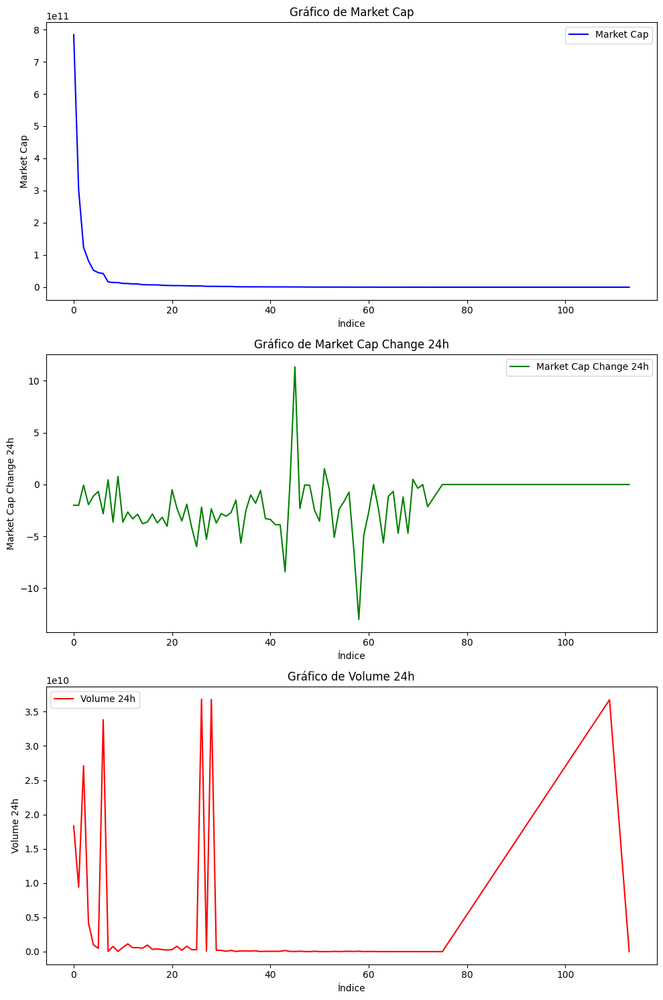

In [16]:
# Crear una figura con tres subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 15))

# Gráfico 1: Market Cap
axs[0].plot(df_categorias['market_cap'], label='Market Cap', color='blue')
axs[0].set_xlabel('Índice')
axs[0].set_ylabel('Market Cap')
axs[0].set_title('Gráfico de Market Cap')
axs[0].legend()

# Gráfico 2: Market Cap Change 24h
axs[1].plot(df_categorias['market_cap_change_24h'], label='Market Cap Change 24h', color='green')
axs[1].set_xlabel('Índice')
axs[1].set_ylabel('Market Cap Change 24h')
axs[1].set_title('Gráfico de Market Cap Change 24h')
axs[1].legend()

# Gráfico 3: Volume 24h
axs[2].plot(df_categorias['volume_24h'], label='Volume 24h', color='red')
axs[2].set_xlabel('Índice')
axs[2].set_ylabel('Volume 24h')
axs[2].set_title('Gráfico de Volume 24h')
axs[2].legend()

# Ajustar la disposición de los subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()

In [17]:
df_categorias_name=df_categorias['name']
df_categorias_name.to_csv('dataset/categoria_name.csv', index=False)

## Categorias de Criptomonedas en CoinGeck
 
1. **Layer 1 (L1)**: Se refiere a las criptomonedas que funcionan en la capa base de una cadena de bloques (blockchain) y no dependen de otra para operar.
2. **Smart Contract Platform**: Son criptomonedas que permiten la ejecución de contratos inteligentes, como Ethereum.
3. **Stablecoins**: Son criptomonedas diseñadas para mantener un valor estable, como Tether (USDT) o USD Coin (USDC).
4. **Alleged SEC Securities**: Criptomonedas que han sido objeto de investigaciones regulatorias de la Comisión de Valores y Bolsa de EE. UU. (SEC).
5. **Exchange-based Tokens**: Tokens emitidos por intercambios de criptomonedas.
6. **Centralized Exchange (CEX)**: Criptomonedas asociadas a intercambios centralizados.
7. **Decentralized Finance (DeFi)**: Criptomonedas utilizadas en aplicaciones y plataformas financieras descentralizadas.
8. **Liquid Staking Tokens**: Tokens que representan activos en staking y permiten la liquidez de los mismos.
9. **Meme**: Criptomonedas relacionadas con memes y entretenimiento, como Dogecoin.
10. **Eth 2.0 Staking**: Criptomonedas relacionadas con el staking en Ethereum 2.0.
11. **Governance**: Tokens utilizados para la gobernanza de protocolos y proyectos.
12. **NFT (Non-Fungible Token)**: Tokens que representan activos únicos y no intercambiables, como obras de arte digitales.
13. **Binance Launchpad**: Criptomonedas lanzadas a través de la plataforma de financiamiento colectivo de Binance.
14. **Decentralized Exchange (DEX)**: Criptomonedas relacionadas con intercambios descentralizados.
15. **Gaming (GameFi)**: Criptomonedas utilizadas en la industria de los videojuegos y GameFi.
16. **Zero Knowledge (ZK)**: Tokens relacionados con la tecnología de conocimiento cero, utilizada en la privacidad.
17. **Yield Farming**: Tokens utilizados en estrategias de yield farming.
18. **Metaverse**: Criptomonedas asociadas a mundos virtuales y experiencias en línea.
19. **Automated Market Maker (AMM)**: Tokens utilizados en protocolos de creación de mercado automatizada.
20. **Play To Earn**: Tokens vinculados a juegos que permiten ganar dinero.
21. **DePIN**: Tokens asociados a aplicaciones de identificación personal.
22. **Privacy Coins**: Criptomonedas diseñadas para garantizar la privacidad y el anonimato.
23. **Wrapped-Tokens**: Tokens envueltos que representan activos de otras cadenas de bloques.
24. **Storage**: Tokens relacionados con soluciones de almacenamiento de datos descentralizado.
25. **Oracle**: Tokens utilizados en oráculos de datos para contratos inteligentes.
26. **Finance / Banking**: Criptomonedas utilizadas en servicios financieros y bancarios.
27. **Liquid Staking Governance Tokens**: Tokens utilizados para gobernanza en redes de staking líquido.
28. **Asset-backed Tokens**: Tokens respaldados por activos del mundo real.
29. **Lending/Borrowing**: Tokens utilizados en plataformas de préstamo y endeudamiento.
30. **Artificial Intelligence (AI)**: Criptomonedas relacionadas con la inteligencia artificial.
31. **Internet of Things (IOT)**: Tokens para aplicaciones de Internet de las cosas.
32. **Derivatives**: Tokens relacionados con instrumentos financieros derivados.
33. **Seigniorage**: Tokens que funcionan en sistemas de seigniorage.
34. **Real World Assets (RWA)**: Tokens respaldados por activos del mundo real.
35. **Sports**: Criptomonedas relacionadas con el mundo del deporte.
36. **SocialFi**: Tokens utilizados en aplicaciones de finanzas sociales.
37. **Perpetuals**: Tokens utilizados en contratos perpetuos.
38. **Tokenized Gold**: Tokens respaldados por oro.
39. **Masternodes**: Tokens utilizados para operaciones de masternode.
40. **Analytics**: Tokens relacionados con servicios de análisis de datos.
41. **Bridge Governance Tokens**: Tokens utilizados para la gobernanza de puentes entre cadenas de bloques.
42. **Synthetic Issuer**: Tokens utilizados en la emisión de activos sintéticos.
43. **Olympus Pro**: Tokens relacionados con Olympus Pro.
44. **Yield Aggregator**: Tokens utilizados en agregadores de rendimiento.
45. **Wallets**: Tokens relacionados con billeteras de criptomonedas.
46. **Gambling**: Tokens utilizados en aplicaciones de juego.
47. **Insurance**: Tokens utilizados en aplicaciones de seguros.
48. **MEV Protection**: Tokens relacionados con la protección contra ataques de extracción de valor en la minería.
49. **Options**: Tokens utilizados en contratos de opciones.
50. **Yearn Ecosystem**: Tokens relacionados con el ecosistema Yearn.
51. **Prediction Markets**: Tokens utilizados en mercados de predicción.
52. **Rebase Tokens**: Tokens que experimentan rebase en su oferta.
53. **NFT Marketplace**: Tokens utilizados en mercados de NFT.
54. **Metagovernance**: Tokens utilizados en sistemas de metagobernanza.
55. **Move To Earn**: Tokens utilizados en programas de recompensas por mudanza.
56. **Telegram Bots**: Tokens relacionados con bots de Telegram.
57. **Fan Token**: Tokens utilizados en aplicaciones de fanáticos.
58. **Guild and Scholarship**: Tokens relacionados con gremios y becas.
59. **BRC-20**: Tokens relacionados con el estándar BRC-20.
60. **Music**: Tokens utilizados en aplicaciones relacionadas con música.
61. **LSDFi**: Tokens relacionados con LSDFi.
62. **Environment**: Tokens utilizados en aplicaciones relacionadas con el medio ambiente.
63. **Synths**: Tokens relacionados con la creación de activos sintéticos.
64. **TRY Stablecoin**: Tokens respaldados por la moneda turca (TRY).
65. **Tourism**: Tokens relacionados con la industria del turismo.
66. **Ohm Fork**: Tokens relacionados con forks de Olympus (Ohm).
67. **Discord Bots**: Tokens relacionados con bots de Discord.
68. **DeFi Index**: Tokens relacionados con índices DeFi.
69. **Kommunitas Launchpad**: Tokens asociados a

## ¿Cuál sería la mejor manera de elegir las 10 criptomonedas que analizar?

Estoy buscando un criterio que me permita elegir las 10 criptomonedas que analizaré.

La función, get_coins_markets te permite obtener una vista panorámica de las criptomonedas más destacadas en función de ciertos criterios y es útil para realizar análisis y comparaciones rápidas entre varias criptomonedas.






In [18]:
# Obtén la lista de las 10 primeras criptomonedas
top_coins = cg.get_coins_markets(vs_currency='usd', order='gecko_desc', per_page=10, page=1)

# Itera a través de las 10 primeras criptomonedas y obtén sus categorías
for coin in top_coins:
    coin_id = coin['id']
    coin_info = cg.get_coin_by_id(coin_id)
    
    if 'categories' in coin_info:
        categories = coin_info['categories']
        print(f"Criptomoneda: {coin_info['name']}")
        print(f"Categorías: {', '.join(categories)}")
        print("------------------------")


Criptomoneda: Bitcoin
Categorías: Cryptocurrency, Layer 1 (L1)
------------------------


Criptomoneda: Ethereum
Categorías: Smart Contract Platform, Layer 1 (L1), Ethereum Ecosystem
------------------------
Criptomoneda: XRP
Categorías: Cryptocurrency
------------------------
Criptomoneda: Solana
Categorías: Alleged SEC Securities, Smart Contract Platform, Solana Ecosystem, Layer 1 (L1)
------------------------
Criptomoneda: BNB
Categorías: Alleged SEC Securities, Smart Contract Platform, Exchange-based Tokens, BNB Chain Ecosystem, Centralized Exchange (CEX), Avalanche Ecosystem, Moonriver Ecosystem, Polygon Ecosystem, Layer 1 (L1), Ethereum Ecosystem
------------------------
Criptomoneda: Dogecoin
Categorías: Cryptocurrency, BNB Chain Ecosystem, Meme
------------------------
Criptomoneda: Cardano
Categorías: Alleged SEC Securities, Smart Contract Platform, Cardano Ecosystem, Layer 1 (L1)
------------------------
Criptomoneda: Chainlink
Categorías: Business Services, Infrastructure, Smart Contract Platform, Decentralized Finance (DeFi), Oracle, BNB Chain Ecosystem, Polkado

Obtuve  10 criptomonedas ordenadas por el parametro gecko_desc, observo que cada moneda puede tener una o varias categorias.

Las categorías son etiquetas utilizadas para agrupar diferentes criptomonedas según su relación o asociación con ciertas plataformas o ecosistemas

Examinando el resultado, es muy amplio para aplicar un criterio, es muy subjetivo 

Estudiando el parametro **order** en la función get_coins_markets de la API de CoinGecko permite ordenar las criptomonedas según diferentes criterios. 

Algunos de los valores que podemos utilizar son:

- **'market_cap_desc':** Ordenar por capitalización de mercado descendente.
- **'market_cap_asc':** Ordenar por capitalización de mercado ascendente.
- **'volume_desc':** Ordenar por volumen de negociación descendente.
- **'volume_asc':** Ordenar por volumen de negociación ascendente.
- **'gecko_desc':** Ordenar por la puntuación de CoinGecko descendente (una medida de la calidad y la actividad del proyecto).
- **'gecko_asc':** Ordenar por la puntuación de CoinGecko ascendente.
- **'name_asc':** Ordenar alfabéticamente por nombre de criptomoneda ascendente.
- **'name_desc':** Ordenar alfabéticamente por nombre de criptomoneda descendente.
- **'price_asc':** Ordenar por precio ascendente.
- **'price_desc':** Ordenar por precio descendente.
- **'h24_change_desc':** Ordenar por cambio en las últimas 24 horas descendente.
- **'h24_change_asc':** Ordenar por cambio en las últimas 24 horas ascendente.

Me llama la atención los parametros **'market_cap_desc'** y **'gecko_desc'**

In [19]:
# Obtén la lista de las 10 primeras criptomonedas ordenadas por capitalización de mercado descendente
top_coins = cg.get_coins_markets(vs_currency='usd', order='market_cap_desc', per_page=10, page=1)

# Itera a través de las 10 primeras criptomonedas y muestra los datos más importantes
for coin in top_coins:
    coin_name = coin['name']
    coin_symbol = coin['symbol']
    coin_market_cap = coin['market_cap']
    coin_price = coin['current_price']
    coin_volume = coin['total_volume']
    coin_change_24h = coin['price_change_percentage_24h']
    
    print(f"Nombre: {coin_name} ({coin_symbol})")
    print(f"Capitalización de Mercado: ${coin_market_cap:,}")  # Agrega comas para mejorar la legibilidad
    print(f"Precio Actual: ${coin_price:,.2f}")
    print(f"Volumen Total: ${coin_volume:,}")
    print(f"Cambio en las últimas 24 horas: {coin_change_24h:.2f}%")
    print("------------------------")



Nombre: Bitcoin (btc)
Capitalización de Mercado: $504,419,567,422
Precio Actual: $25,836.00
Volumen Total: $12,623,557,693
Cambio en las últimas 24 horas: -1.11%
------------------------
Nombre: Ethereum (eth)
Capitalización de Mercado: $198,169,493,943
Precio Actual: $1,642.08
Volumen Total: $7,798,673,013
Cambio en las últimas 24 horas: -0.29%
------------------------
Nombre: Tether (usdt)
Capitalización de Mercado: $82,709,322,512
Precio Actual: $1.00
Volumen Total: $18,874,894,565
Cambio en las últimas 24 horas: -0.09%
------------------------
Nombre: BNB (bnb)
Capitalización de Mercado: $33,232,574,909
Precio Actual: $215.45
Volumen Total: $402,977,311
Cambio en las últimas 24 horas: -1.14%
------------------------
Nombre: XRP (xrp)
Capitalización de Mercado: $27,151,068,581
Precio Actual: $0.51
Volumen Total: $872,740,314
Cambio en las últimas 24 horas: -0.56%
------------------------
Nombre: USD Coin (usdc)
Capitalización de Mercado: $25,831,652,638
Precio Actual: $1.00
Volumen 

### Obtenemos un listado de criptomonedas ordenadas por capitalización de mercado descendente usando el parámetro order 'market_cap_desc' de la función get_coins_markets de la API de CoinGecko

¿Por qué? Es fácil de entender y proporciona una lista simple de criptomonedas muy populares. La capitalización de mercado es una medida de cuánto valor total tiene una criptomoneda en circulación. Ordenar por capitalización de mercado descendente mostrará las criptomonedas más grandes primero, lo que generalmente incluye aquellas que son ampliamente conocidas y utilizadas.

Este enfoque es amigable porque:

1. **Familiaridad**: todos suelen haber oído hablar de las criptomonedas más grandes como Bitcoin y Ethereum, por lo que verán estas monedas en la parte superior de la lista.

2. **Simplicidad**: No requiere entender conceptos técnicos complejos. La capitalización de mercado es una medida "relativamente" fácil de entender.

3. **Visibilidad**: Las criptomonedas con una alta capitalización de mercado suelen ser más estables y tienen una comunidad más grande detrás de ellas, lo que puede ser tranquilizador para quienes quieren empezar a conocer este mundo.

In [20]:
# Crea una lista para almacenar los IDs de las 10 criptomonedas
top_coin_ids = []

# Itera a través de las 10 primeras criptomonedas y almacena sus IDs en la lista
for coin in top_coins:
    coin_id = coin['id']
    top_coin_ids.append(coin_id)

# Imprime la lista de IDs
print(top_coin_ids)

['bitcoin', 'ethereum', 'tether', 'binancecoin', 'ripple', 'usd-coin', 'staked-ether', 'cardano', 'dogecoin', 'solana']


Sin embargo la siguiente categoria me llama la atención

15. **Gaming (GameFi)**: Criptomonedas utilizadas en la industria de los videojuegos y GameFi.

Como memcione lineas arriba me parece muy subjetivo y la industria de los videojuegos siempre es muy activa y sencilla de entender 

In [21]:
# Define the API endpoint
endpoint = "https://api.coingecko.com/api/v3/coins/markets?vs_currency=usd&category=gaming&order=market_cap_desc&per_page=10&page=1&sparkline=false&locale=en"

# Make the request
top_coins_gaiming = requests.get(endpoint)

# Check the response status code
if top_coins_gaiming.status_code == 200:

    # Decode the JSON response
    top_coins_gaiming_data = top_coins_gaiming.json()

    # Print the top 10 cryptocurrencies
    for coin in top_coins_gaiming_data:
        #print(coin["name"], coin["market_cap"])
        coin_name = coin['name']
        coin_symbol = coin['symbol']
        coin_market_cap = coin['market_cap']
        coin_price = coin['current_price']
        coin_volume = coin['total_volume']
        coin_change_24h = coin['price_change_percentage_24h']
        
        print(f"Nombre: {coin_name} ({coin_symbol})")
        print(f"Capitalización de Mercado: ${coin_market_cap:,}")  # Agrega comas para mejorar la legibilidad
        print(f"Precio Actual: ${coin_price:,.2f}")
        print(f"Volumen Total: ${coin_volume:,}")
        print(f"Cambio en las últimas 24 horas: {coin_change_24h:.2f}%")
        print("------------------------")        

else:
    print("Error:", top_coins_gaiming.status_code)


Nombre: Internet Computer (icp)
Capitalización de Mercado: $1,545,743,913
Precio Actual: $3.50
Volumen Total: $24,286,233
Cambio en las últimas 24 horas: -0.81%
------------------------
Nombre: The Sandbox (sand)
Capitalización de Mercado: $656,048,483
Precio Actual: $0.32
Volumen Total: $48,192,061
Cambio en las últimas 24 horas: -1.49%
------------------------
Nombre: Axie Infinity (axs)
Capitalización de Mercado: $627,525,227
Precio Actual: $4.79
Volumen Total: $16,901,055
Cambio en las últimas 24 horas: -1.83%
------------------------
Nombre: ImmutableX (imx)
Capitalización de Mercado: $622,832,939
Precio Actual: $0.56
Volumen Total: $20,170,572
Cambio en las últimas 24 horas: -5.40%
------------------------
Nombre: ApeCoin (ape)
Capitalización de Mercado: $516,801,555
Precio Actual: $1.40
Volumen Total: $57,586,671
Cambio en las últimas 24 horas: -4.62%
------------------------
Nombre: GALA (gala)
Capitalización de Mercado: $490,626,502
Precio Actual: $0.02
Volumen Total: $485,088

In [22]:
# Crea una lista para almacenar los IDs de las 10 criptomonedas
top_coin_gaming_ids = []

# Itera a través de las 10 primeras criptomonedas y almacena sus IDs en la lista
for coin in top_coins_gaiming_data:
    coin_id = coin['id']
    top_coin_gaming_ids.append(coin_id)

# Imprime la lista de IDs
print(top_coin_gaming_ids)

['internet-computer', 'the-sandbox', 'axie-infinity', 'immutable-x', 'apecoin', 'gala', 'illuvium', 'enjincoin', 'stepn', 'floki']


##  Lista de criptomoneda

In [23]:
# Obtén precios de criptomonedas en dólares
combined_top_coins = top_coin_ids + top_coin_gaming_ids
combined_top_coins

['bitcoin',
 'ethereum',
 'tether',
 'binancecoin',
 'ripple',
 'usd-coin',
 'staked-ether',
 'cardano',
 'dogecoin',
 'solana',
 'internet-computer',
 'the-sandbox',
 'axie-infinity',
 'immutable-x',
 'apecoin',
 'gala',
 'illuvium',
 'enjincoin',
 'stepn',
 'floki']

## 10 criptomonedas seleccionadas por mercado de capitales y 10 criptomonedas por categoria Gaming  

In [24]:
print(top_coin_ids)
print(top_coin_gaming_ids)


['bitcoin', 'ethereum', 'tether', 'binancecoin', 'ripple', 'usd-coin', 'staked-ether', 'cardano', 'dogecoin', 'solana']
['internet-computer', 'the-sandbox', 'axie-infinity', 'immutable-x', 'apecoin', 'gala', 'illuvium', 'enjincoin', 'stepn', 'floki']


## Obtener valores historicos 

Se obtienen valores de los ultimos 5 años
valos antes, durante y después de pandemia 

In [25]:
# Diccionarios para traducir los nombres en inglés a español
meses_ingles_a_espanol = {
    'January': '01 Enero',
    'February': '02 Febrero',
    'March': '03 Marzo',
    'April': '04 Abril',
    'May': '05 Mayo',
    'June': '06 Junio',
    'July': '07 Julio',
    'August': '08 Agosto',
    'September': '09 Septiembre',
    'October': '20 Octubre',
    'November': '21 Noviembre',
    'December': '22 Diciembre'
}

dias_semana_ingles_a_espanol = {
    'Monday': '1 Lunes',
    'Tuesday': '2 Martes',
    'Wednesday': '3 Miércoles',
    'Thursday': '4 Jueves',
    'Friday': '5 Viernes',
    'Saturday': '6 Sábado',
    'Sunday': '7 Domingo'
}

In [26]:
# Obtén la fecha actual y la fecha hace 5 años
end_date = datetime.datetime.now()
start_date = end_date - datetime.timedelta(days=5*365)

# Crear un DataFrame para almacenar los datos
data_list = []

# Itera a través de los IDs de las criptomonedas y obtén datos históricos
for coin_id in combined_top_coins:
    historical_data = cg.get_coin_market_chart_range_by_id(id=coin_id, vs_currency='usd', from_timestamp=start_date.timestamp(), to_timestamp=end_date.timestamp())
    
    # Los datos están en un formato donde cada tipo de información tiene su propia lista
    timestamps = historical_data['prices']
    market_caps = historical_data['market_caps']
    total_volumes = historical_data['total_volumes']

    # Itera a través de los datos y crea una entrada para cada punto de datos
    for i in range(len(timestamps)):
        timestamp = timestamps[i][0]
        date = datetime.datetime.fromtimestamp(timestamp / 1000.0)
        price = timestamps[i][1]
        market_cap = market_caps[i][1]
        volume = total_volumes[i][1]

        # Traducir el mes y el día de la semana al español
        mes_en_ingles = date.strftime('%B')  # Nombre del mes en inglés
        mes_en_espanol = meses_ingles_a_espanol.get(mes_en_ingles, mes_en_ingles)

        dia_semana_en_ingles = date.strftime('%A')  # Nombre del día de la semana en inglés
        dia_semana_en_espanol = dias_semana_ingles_a_espanol.get(dia_semana_en_ingles, dia_semana_en_ingles)


        # Agregar campos separados
        data = {
            'Criptomoneda': coin_id,
            'Fecha': date,
            'Precio': price,
            'Mercado': market_cap,
            'Volumen': volume,
            'Año': date.year,
            'Mes': date.month,
            'Mes_Nombre': mes_en_espanol,
            'Día': date.day,
            'Día_Semana': dia_semana_en_espanol,
            'Hora': date.hour
        }

        data_list.append(data)
# Crear un DataFrame a partir de la lista de datos
df = pd.DataFrame(data_list)

# Guardar el DataFrame en un archivo CSV
df.to_csv('dataset/datos_historicos.csv', index=False)

In [27]:
df

,Criptomoneda,Fecha,Precio,Mercado,Volumen,Año,Mes,Mes_Nombre,Día,Día_Semana,Hora
0,bitcoin,2018-08-26 19:00:00,6728.288003,1.154066e+11,5.215046e+09,2018,8,08 Agosto,26,7 Domingo,19
1,bitcoin,2018-08-27 19:00:00,6911.096029,1.185460e+11,5.444350e+09,2018,8,08 Agosto,27,1 Lunes,19
2,bitcoin,2018-08-28 19:00:00,7075.983405,1.219923e+11,6.246603e+09,2018,8,08 Agosto,28,2 Martes,19
3,bitcoin,2018-08-29 19:00:00,7046.748947,1.214796e+11,5.976493e+09,2018,8,08 Agosto,29,3 Miércoles,19
4,bitcoin,2018-08-30 19:00:00,7024.145107,1.211032e+11,6.587864e+09,2018,8,08 Agosto,30,4 Jueves,19
...,...,...,...,...,...,...,...,...,...,...,...
26021,floki,2023-08-20 19:00:00,0.000019,1.879566e+08,5.994608e+06,2023,8,08 Agosto,20,7 Domingo,19
26022,floki,2023-08-21 19:00:00,0.000018,1.829568e+08,6.649739e+06,2023,8,08 Agosto,21,1 Lunes,19
26023,floki,2023-08-22 19:00:00,0.000018,1.792757e+08,7.070170e+06,2023,8,08 Agosto,22,2 Martes,19
26024,floki,2023-08-23 19:00:00,0.000019,1.840366e+08,6.836573e+06,2023,8,08 Agosto,23,3 Miércoles,19


In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26026 entries, 0 to 26025
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Criptomoneda  26026 non-null  object        
 1   Fecha         26026 non-null  datetime64[ns]
 2   Precio        26026 non-null  float64       
 3   Mercado       26026 non-null  float64       
 4   Volumen       26026 non-null  float64       
 5   Año           26026 non-null  int64         
 6   Mes           26026 non-null  int64         
 7   Mes_Nombre    26026 non-null  object        
 8   Día           26026 non-null  int64         
 9   Día_Semana    26026 non-null  object        
 10  Hora          26026 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(4), object(3)
memory usage: 2.2+ MB


In [29]:
columnas_coin=['Precio','Mercado','Volumen']

In [30]:
df[columnas_coin].describe()

,Precio,Mercado,Volumen
count,2.602600e+04,2.602600e+04,2.602600e+04
mean,1.788380e+03,5.139054e+10,6.866371e+09
std,7.230367e+03,1.431978e+11,1.862900e+10
min,1.062747e-07,0.000000e+00,6.217976e+01
25%,3.107615e-01,4.787051e+08,5.192249e+07
50%,1.002245e+00,4.206507e+09,3.855190e+08
75%,6.922100e+01,3.096054e+10,3.256711e+09
max,6.761702e+04,1.278798e+12,9.267677e+11


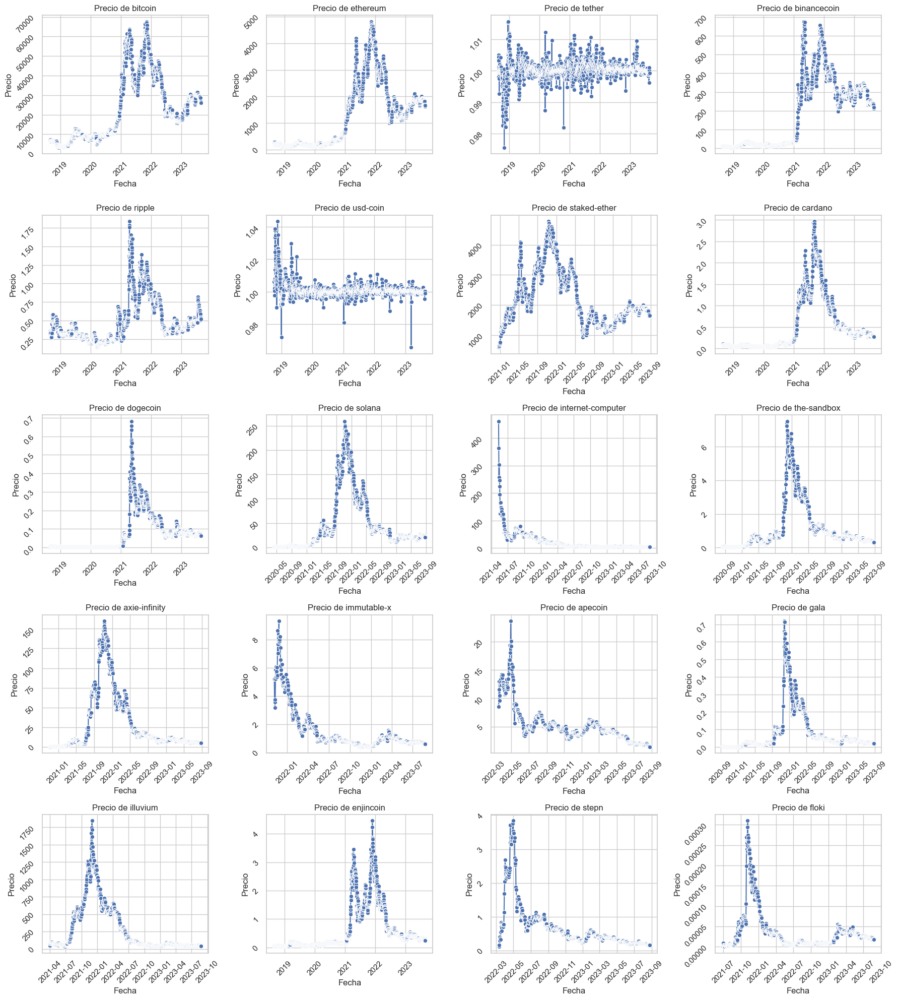

In [31]:

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Filtrar el DataFrame para incluir solo las criptomonedas deseadas
filtered_df = df[df['Criptomoneda'].isin(combined_top_coins)]

# Obtener la lista de criptomonedas únicas
criptomonedas_unicas = filtered_df['Criptomoneda'].unique()

# Configurar el diseño de los subplots
num_filas = (len(criptomonedas_unicas) + 3) // 4  # Redondear al número entero superior
fig, axs = plt.subplots(num_filas, 4, figsize=(18, num_filas * 4))
fig.subplots_adjust(hspace=0.5)  # Espaciado vertical entre los subplots

# Iterar a través de las criptomonedas y crear gráficos para cada una
for i, criptomoneda in enumerate(criptomonedas_unicas):
    row = i // 4
    col = i % 4
    ax = axs[row, col]

    # Filtrar datos para la criptomoneda actual
    data = filtered_df[filtered_df['Criptomoneda'] == criptomoneda]

    # Crear el gráfico usando Seaborn
    sns.lineplot(x='Fecha', y='Precio', data=data, marker='o', ax=ax)
    ax.set_title(f'Precio de {criptomoneda}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Precio')
    ax.tick_params(rotation=45)

# Ocultar los subplots vacíos si es necesario
for i in range(len(criptomonedas_unicas), num_filas * 4):
    row = i // 4
    col = i % 4
    axs[row, col].axis('off')

# Ajustar el diseño general y mostrar los gráficos
plt.tight_layout()
plt.show()


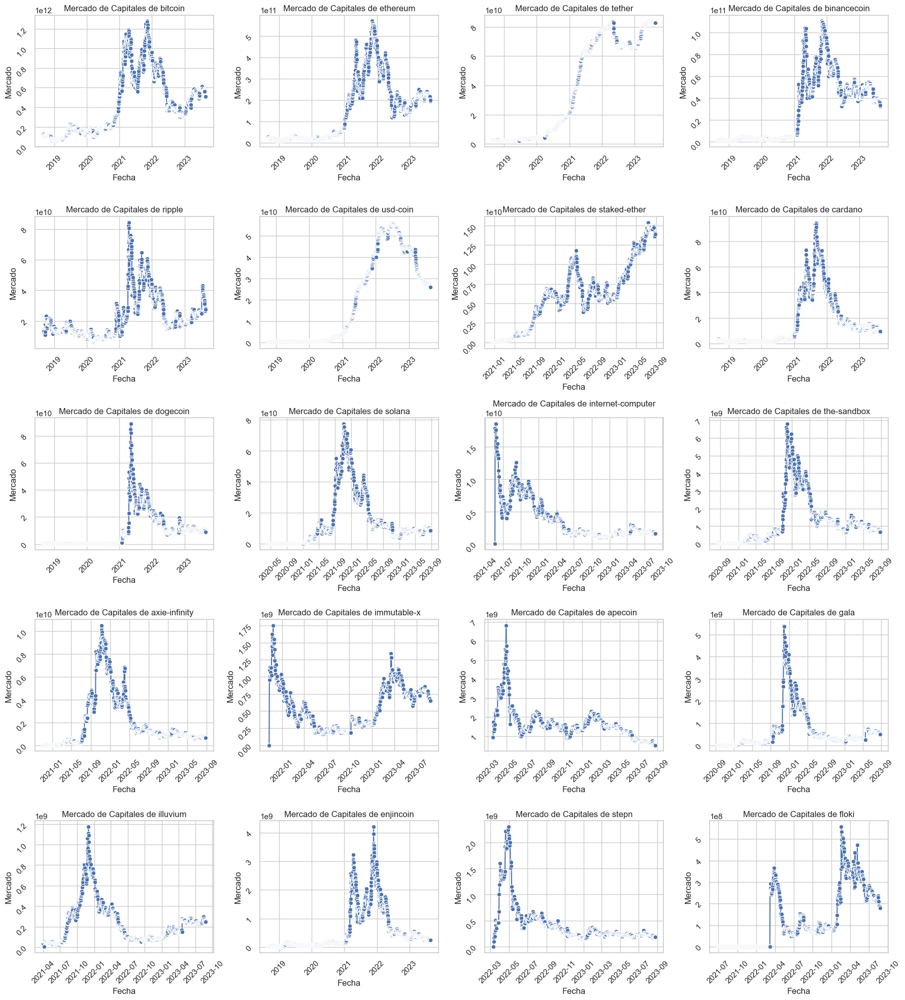

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Filtrar el DataFrame para incluir solo las criptomonedas deseadas
filtered_df = df[df['Criptomoneda'].isin(combined_top_coins)]

# Obtener la lista de criptomonedas únicas
criptomonedas_unicas = filtered_df['Criptomoneda'].unique()

# Configurar el diseño de los subplots
num_filas = (len(criptomonedas_unicas) + 3) // 4  # Redondear al número entero superior
fig, axs = plt.subplots(num_filas, 4, figsize=(18, num_filas * 4))
fig.subplots_adjust(hspace=0.5)  # Espaciado vertical entre los subplots

# Iterar a través de las criptomonedas y crear gráficos para cada una
for i, criptomoneda in enumerate(criptomonedas_unicas):
    row = i // 4
    col = i % 4
    ax = axs[row, col]

    # Filtrar datos para la criptomoneda actual
    data = filtered_df[filtered_df['Criptomoneda'] == criptomoneda]

    # Crear el gráfico usando Seaborn
    sns.lineplot(x='Fecha', y='Mercado', data=data, marker='o', ax=ax)
    ax.set_title(f'Mercado de Capitales de {criptomoneda}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Mercado')
    ax.tick_params(rotation=45)

# Ocultar los subplots vacíos si es necesario
for i in range(len(criptomonedas_unicas), num_filas * 4):
    row = i // 4
    col = i % 4
    axs[row, col].axis('off')

# Ajustar el diseño general y mostrar los gráficos
plt.tight_layout()
plt.show()

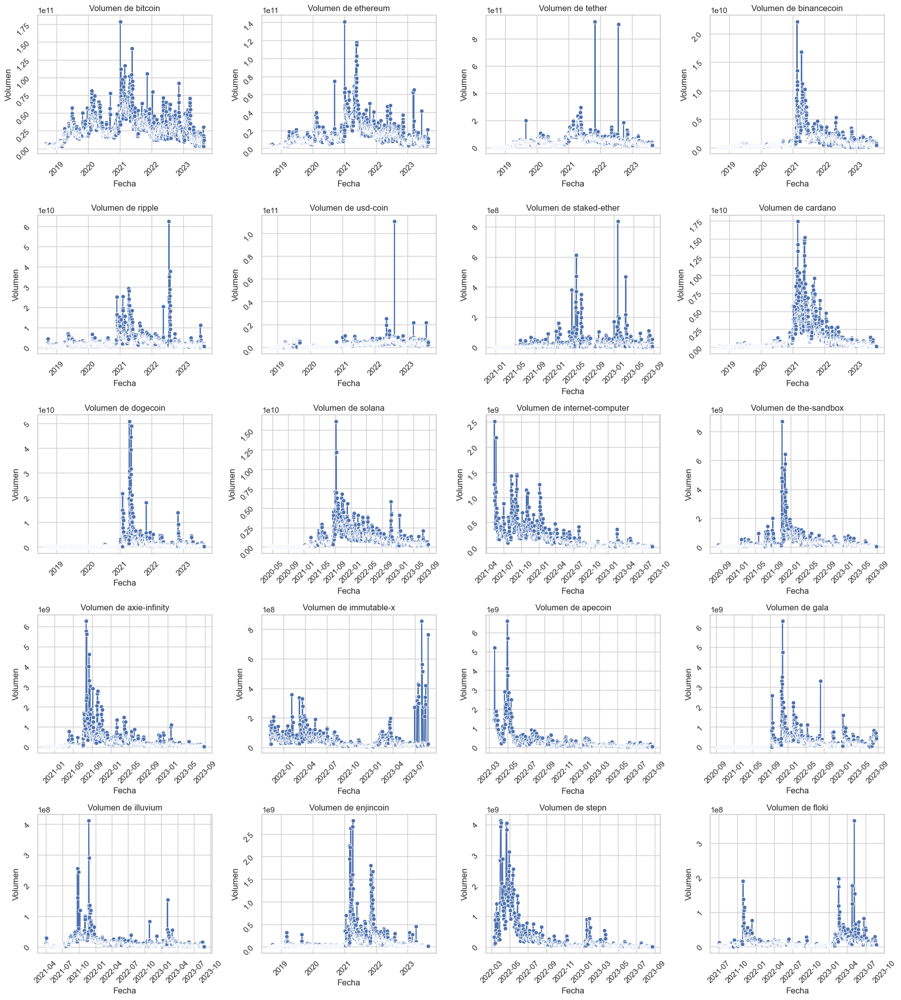

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Filtrar el DataFrame para incluir solo las criptomonedas deseadas
filtered_df = df[df['Criptomoneda'].isin(combined_top_coins)]

# Obtener la lista de criptomonedas únicas
criptomonedas_unicas = filtered_df['Criptomoneda'].unique()

# Configurar el diseño de los subplots
num_filas = (len(criptomonedas_unicas) + 3) // 4  # Redondear al número entero superior
fig, axs = plt.subplots(num_filas, 4, figsize=(18, num_filas * 4))
fig.subplots_adjust(hspace=0.5)  # Espaciado vertical entre los subplots

# Iterar a través de las criptomonedas y crear gráficos para cada una
for i, criptomoneda in enumerate(criptomonedas_unicas):
    row = i // 4
    col = i % 4
    ax = axs[row, col]

    # Filtrar datos para la criptomoneda actual
    data = filtered_df[filtered_df['Criptomoneda'] == criptomoneda]

    # Crear el gráfico usando Seaborn
    sns.lineplot(x='Fecha', y='Volumen', data=data, marker='o', ax=ax)
    ax.set_title(f'Volumen de {criptomoneda}')
    ax.set_xlabel('Fecha')
    ax.set_ylabel('Volumen')
    ax.tick_params(rotation=45)

# Ocultar los subplots vacíos si es necesario
for i in range(len(criptomonedas_unicas), num_filas * 4):
    row = i // 4
    col = i % 4
    axs[row, col].axis('off')

# Ajustar el diseño general y mostrar los gráficos
plt.tight_layout()
plt.show()

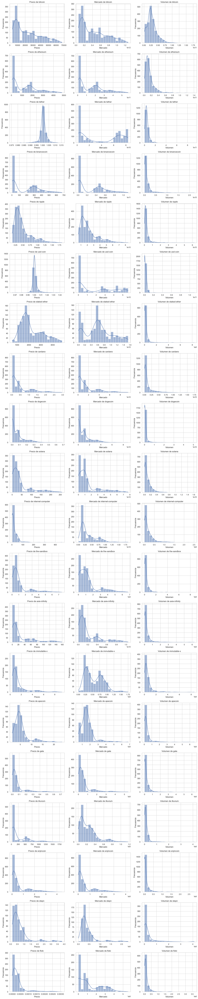

In [34]:
# Configurar el diseño de los subplots
num_filas = len(combined_top_coins)
num_columnas = len(columnas_coin)

fig, axs = plt.subplots(num_filas, num_columnas, figsize=(16, num_filas * 4))
fig.subplots_adjust(hspace=0.5)  # Espaciado vertical entre los subplots

# Iterar a través de las criptomonedas y las columnas
for i, criptomoneda in enumerate(combined_top_coins):
    for j, columna in enumerate(columnas_coin):
        ax = axs[i, j]

        # Filtrar datos para la criptomoneda actual y la columna actual
        data = filtered_df[filtered_df['Criptomoneda'] == criptomoneda]
        
        # Crear el histograma usando Seaborn
        sns.histplot(data[columna], bins=20, ax=ax, kde=True)
        ax.set_title(f'{columna} de {criptomoneda}')
        ax.set_xlabel(columna)
        ax.set_ylabel('Frecuencia')

# Ajustar el diseño general y mostrar los gráficos
plt.tight_layout()
plt.show()

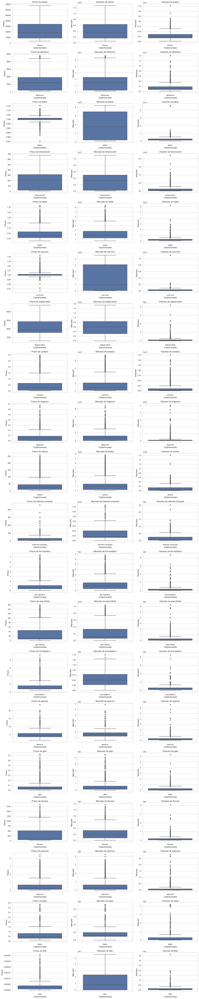

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Filtrar el DataFrame para incluir solo las criptomonedas deseadas
filtered_df = df[df['Criptomoneda'].isin(combined_top_coins)]

# Lista de columnas a graficar
columnas_coin = ['Precio', 'Mercado', 'Volumen']

# Configurar el diseño de los subplots
num_filas = len(combined_top_coins)
num_columnas = len(columnas_coin)

fig, axs = plt.subplots(num_filas, num_columnas, figsize=(16, num_filas * 4))
fig.subplots_adjust(hspace=0.5)  # Espaciado vertical entre los subplots

# Iterar a través de las criptomonedas y las columnas
for i, criptomoneda in enumerate(combined_top_coins):
    for j, columna in enumerate(columnas_coin):
        ax = axs[i, j]

        # Filtrar datos para la criptomoneda actual y la columna actual
        data = filtered_df[filtered_df['Criptomoneda'] == criptomoneda]
        
        # Crear el gráfico de caja usando Seaborn
        sns.boxplot(data=data, x='Criptomoneda', y=columna, ax=ax)
        ax.set_title(f'{columna} de {criptomoneda}')
        ax.set_xlabel('Criptomoneda')
        ax.set_ylabel(columna)

# Ajustar el diseño general y mostrar los gráficos
plt.tight_layout()
plt.show()


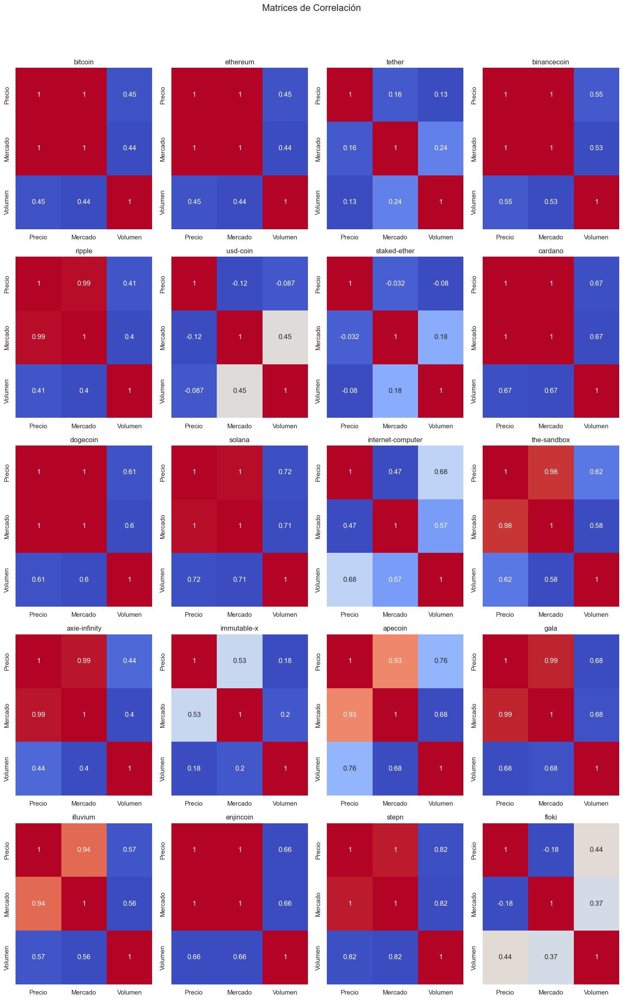

In [36]:
# Crear una lista vacía para almacenar las matrices de correlación
correlation_matrices = []

# Número de columnas por fila
columns_per_row = 4

# Calcular el número total de filas requeridas
total_rows = (len(combined_top_coins) + 3) // 4

# Crear una figura de matplotlib con subplots
fig, axes = plt.subplots(nrows=total_rows, ncols=columns_per_row, figsize=(15, 5 * total_rows))
fig.suptitle('Matrices de Correlación', fontsize=16)

# Aplanar la matriz de ejes para facilitar el acceso
axes = axes.flatten()

# Recorrer las criptomonedas en combined_top_coins
for i, cripto in enumerate(combined_top_coins):
    # Filtrar el DataFrame df_ohlc para la criptomoneda actual
    df_cripto = df[df['Criptomoneda'] == cripto]
    
    # Calcular la matriz de correlación para esta criptomoneda
    correlation_matrix = df_cripto[columnas_coin].corr()
    
    # Dibujar la matriz de correlación en el subplot correspondiente
    sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, cbar=False, ax=axes[i])
    
    # Establecer el título del subplot
    axes[i].set_title(cripto, fontsize=12)

# Eliminar los ejes vacíos si es necesario
if len(combined_top_coins) % 4 != 0:
    for j in range(len(combined_top_coins) % 4, 4):
        fig.delaxes(axes[-j])

# Ajustar el espaciado entre subplots
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Mostrar el gráfico
plt.show()

Existe una correlacion entre Precio y Mercado

In [37]:
df[['Precio','Mercado']].describe()


,Precio,Mercado
count,2.602600e+04,2.602600e+04
mean,1.788380e+03,5.139054e+10
std,7.230367e+03,1.431978e+11
min,1.062747e-07,0.000000e+00
25%,3.107615e-01,4.787051e+08
50%,1.002245e+00,4.206507e+09
75%,6.922100e+01,3.096054e+10
max,6.761702e+04,1.278798e+12


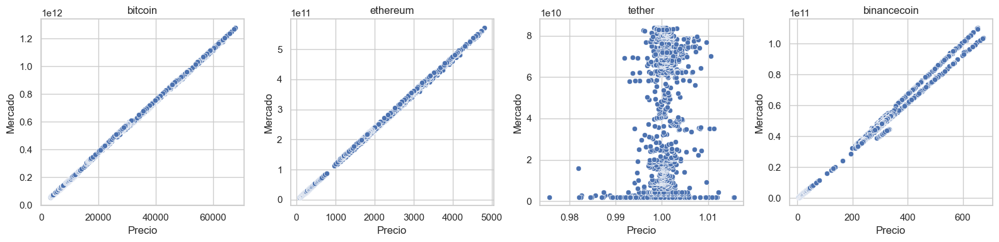

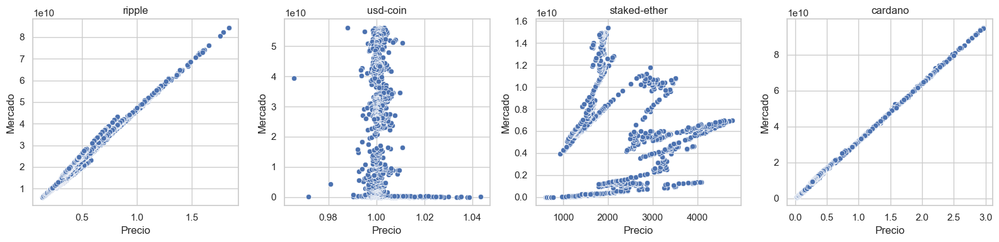

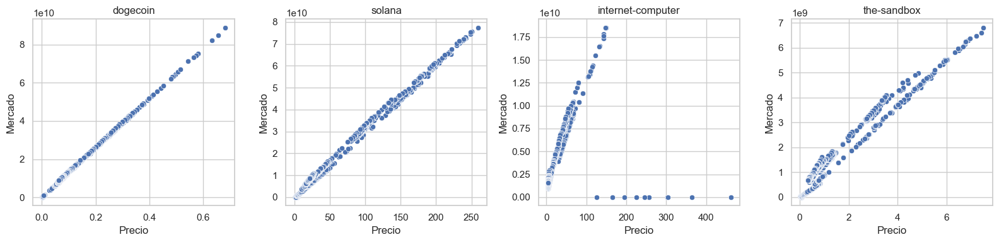

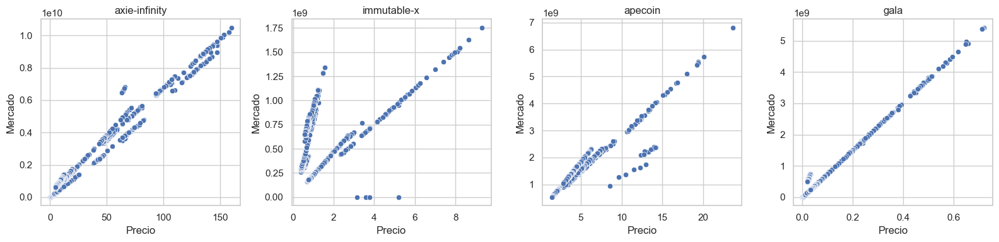

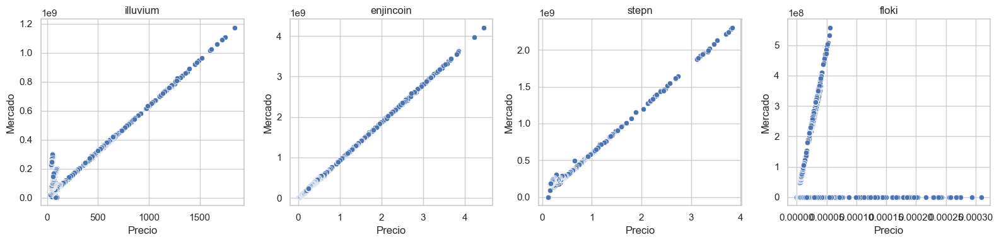

In [38]:
# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Lista de columnas a graficar
columnas_coin_bi = ['Precio', 'Mercado']

# Dividir las criptomonedas en grupos de 4 para los subplots
grupos_criptomonedas = [criptomonedas_unicas[i:i+4] for i in range(0, len(criptomonedas_unicas), 4)]

# Configurar el diseño de los subplots
num_filas = len(grupos_criptomonedas)

# Iterar a través de los grupos de criptomonedas
for grupo_criptomonedas in grupos_criptomonedas:
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    
    for i, criptomoneda in enumerate(grupo_criptomonedas):
        ax = axs[i]

        # Filtrar datos para la criptomoneda actual y las columnas de interés
        data = filtered_df[filtered_df['Criptomoneda'] == criptomoneda][columnas_coin_bi]

        # Crear el gráfico de dispersión usando Seaborn
        sns.scatterplot(x='Precio', y='Mercado', data=data, ax=ax)
        ax.set_title(f'{criptomoneda}')

    # Ajustar el diseño de la fila y mostrar los gráficos
    plt.tight_layout()
    plt.show()


In [39]:
# Obtén los tipos de cambio en USD para cada criptomoneda
data = {}

for crypto in combined_top_coins:
    crypto_data = cg.get_price(ids=crypto, vs_currencies='usd')
    data[crypto] = crypto_data[crypto]['usd']

# Crear un DataFrame a partir de los datos
df_ex = pd.DataFrame(data.items(), columns=['Criptomoneda', 'Tipo de Cambio USD'])

In [40]:
# Supongamos que tienes un DataFrame df con las columnas "Criptomoneda", "Fecha" y "Precio".
# Y tienes un DataFrame df_ex con las columnas "Criptomoneda" y "Tipo de Cambio".

# Calcular el precio máximo y mínimo por moneda en df.
df_max = df.groupby('Criptomoneda')['Precio'].max().reset_index()
df_min = df.groupby('Criptomoneda')['Precio'].min().reset_index()

# Renombrar las columnas para que sean específicas.
df_max.rename(columns={'Precio': 'Precio Maximo'}, inplace=True)
df_min.rename(columns={'Precio': 'Precio Minimo'}, inplace=True)

# Combinar los DataFrames df_max y df_min con df_ex en función de la columna "Criptomoneda".
df_ex = pd.merge(df_ex, df_max, on='Criptomoneda', how='left')
df_ex = pd.merge(df_ex, df_min, on='Criptomoneda', how='left')

#print(df_ex)


In [41]:
# Mostrar el DataFrame con los tipos de cambio
df_ex.to_csv('dataset/crypto_tc.csv', index=False)

In [42]:
# Visualizar el DataFrame resultante.
df_ex

,Criptomoneda,Tipo de Cambio USD,Precio Maximo,Precio Minimo
0,bitcoin,25820.000000,67617.015545,3.216627e+03
1,ethereum,1648.100000,4815.004634,8.378596e+01
2,tether,1.000000,1.015651,9.755416e-01
3,binancecoin,216.250000,675.098974,4.470332e+00
4,ripple,0.515156,1.837677,1.378296e-01
5,usd-coin,1.002000,1.043465,9.655782e-01
6,staked-ether,1642.370000,4775.452755,5.967677e+02
7,cardano,0.260754,2.967075,2.371597e-02
8,dogecoin,0.062248,0.681842,1.483468e-03
9,solana,20.440000,259.239558,5.139235e-01


In [65]:
# ID de la criptomoneda que deseas obtener (en este caso, Bitcoin)
crypto_id = 'bitcoin'

# Obtener todos los datos disponibles para la criptomoneda
crypto_data = cg.get_coin_by_id(id=crypto_id)

# Mostrar todos los campos disponibles
# for key, value in crypto_data.items():
#   print(f"{key}: {value}")


In [44]:
crypto_data = {}

# Obtener todos los datos para cada criptomoneda y agregarlos al diccionario
for crypto in combined_top_coins:
    data = cg.get_coin_by_id(id=crypto)
    for key, value in data.items():
        if key in crypto_data:
            crypto_data[key].append(value)
        else:
            crypto_data[key] = [value]  # Crea una nueva lista si es la primera vez que se encuentra este campo

# Asegurarse de que todas las listas tengan la misma longitud llenando con None donde falten datos
max_len = max(len(value) for value in crypto_data.values())
for key, value in crypto_data.items():
    if len(value) < max_len:
        crypto_data[key] += [None] * (max_len - len(value))


# Crear un DataFrame a partir del diccionario
df_crypto = pd.DataFrame(crypto_data)

# Guardar el DataFrame en un archivo CSV
df_crypto.to_csv('dataset/crypto_data.csv', index=False)

In [45]:
df_crypto

,id,symbol,name,asset_platform_id,platforms,detail_platforms,block_time_in_minutes,hashing_algorithm,categories,public_notice,...,public_interest_score,market_data,community_data,developer_data,public_interest_stats,status_updates,last_updated,tickers,ico_data,contract_address
0,bitcoin,btc,Bitcoin,None,{'': ''},"{'': {'decimal_place': None, 'contract_address...",10,SHA-256,"[Cryptocurrency, Layer 1 (L1)]",None,...,0.073,"{'current_price': {'aed': 95270, 'ars': 907764...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 35581, 'stars': 71043, 'subscribers'...","{'alexa_rank': 9440, 'bing_matches': None}",[],2023-08-25T15:11:48.216Z,"[{'base': 'BTC', 'target': 'USDT', 'market': {...","{'ico_start_date': '2014-07-20T00:00:00.000Z',...",0xdac17f958d2ee523a2206206994597c13d831ec7
1,ethereum,eth,Ethereum,None,{'': ''},"{'': {'decimal_place': None, 'contract_address...",0,Ethash,"[Smart Contract Platform, Layer 1 (L1), Ethere...",None,...,0.236,"{'current_price': {'aed': 6057.01, 'ars': 5771...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 18322, 'stars': 43418, 'subscribers'...","{'alexa_rank': 8793, 'bing_matches': None}",[],2023-08-25T15:12:40.672Z,"[{'base': 'ETH', 'target': 'USD', 'market': {'...","{'ico_start_date': None, 'ico_end_date': None,...",0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48
2,tether,usdt,Tether,ethereum,{'ethereum': '0xdac17f958d2ee523a2206206994597...,"{'ethereum': {'decimal_place': 6, 'contract_ad...",0,None,"[Mantle Ecosystem, Stablecoins, USD Stablecoin...",Tether announced the ending of the support of ...,...,0.029,"{'current_price': {'aed': 3.67, 'ars': 350.05,...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 0, 'stars': 0, 'subscribers': 0, 'to...","{'alexa_rank': 74251, 'bing_matches': None}",[],2023-08-25T15:10:00.702Z,"[{'base': 'USDC', 'target': 'USDT', 'market': ...","{'ico_start_date': '2017-10-30T00:00:00.000Z',...",0xae7ab96520de3a18e5e111b5eaab095312d7fe84
3,binancecoin,bnb,BNB,None,"{'': '', 'ethereum': '0xb8c77482e45f1f44de1745...","{'': {'decimal_place': None, 'contract_address...",0,None,"[Alleged SEC Securities, Smart Contract Platfo...",None,...,11.364,"{'current_price': {'aed': 794.34, 'ars': 75687...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 2140, 'stars': 3847, 'subscribers': ...","{'alexa_rank': 888, 'bing_matches': None}","[{'description': 'Binance Black Friday - $100,...",2023-08-25T15:13:00.157Z,"[{'base': 'BNB', 'target': 'USDT', 'market': {...",None,0x3845badade8e6dff049820680d1f14bd3903a5d0
4,ripple,xrp,XRP,None,{'': ''},"{'': {'decimal_place': None, 'contract_address...",0,None,[Cryptocurrency],None,...,0.022,"{'current_price': {'aed': 1.89, 'ars': 180.4, ...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 1475, 'stars': 4345, 'subscribers': ...","{'alexa_rank': 23989, 'bing_matches': None}",[],2023-08-25T15:12:36.447Z,"[{'base': 'XRP', 'target': 'USDT', 'market': {...",None,0xbb0e17ef65f82ab018d8edd776e8dd940327b28b
5,usd-coin,usdc,USD Coin,ethereum,{'ethereum': '0xa0b86991c6218b36c1d19d4a2e9eb0...,"{'ethereum': {'decimal_place': 6, 'contract_ad...",0,None,"[Mantle Ecosystem, Stablecoins, USD Stablecoin...",None,...,0.033,"{'current_price': {'aed': 3.68, 'ars': 350.59,...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 266, 'stars': 434, 'subscribers': 29...","{'alexa_rank': 65370, 'bing_matches': None}",[],2023-08-25T15:12:39.721Z,"[{'base': 'BTC', 'target': 'USDC', 'market': {...",None,0xf57e7e7c23978c3caec3c3548e3d615c346e79ff
6,staked-ether,steth,Lido Staked Ether,ethereum,{'ethereum': '0xae7ab96520de3a18e5e111b5eaab09...,"{'ethereum': {'decimal_place': 18, 'contract_a...",0,None,"[Decentralized Finance (DeFi), Eth 2.0 Staking...",None,...,0.023,"{'current_price': {'aed': 6047.98, 'ars': 5762...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 0, 'stars': 0, 'subscribers': 0, 'to...","{'alexa_rank': None, 'bing_matches': None}",[],2023-08-25T15:12:42.131Z,[

In [46]:
df_crypto.columns

Index(['id', 'symbol', 'name', 'asset_platform_id', 'platforms',
       'detail_platforms', 'block_time_in_minutes', 'hashing_algorithm',
       'categories', 'public_notice', 'additional_notices', 'localization',
       'description', 'links', 'image', 'country_origin', 'genesis_date',
       'sentiment_votes_up_percentage', 'sentiment_votes_down_percentage',
       'watchlist_portfolio_users', 'market_cap_rank', 'coingecko_rank',
       'coingecko_score', 'developer_score', 'community_score',
       'liquidity_score', 'public_interest_score', 'market_data',
       'community_data', 'developer_data', 'public_interest_stats',
       'status_updates', 'last_updated', 'tickers', 'ico_data',
       'contract_address'],
      dtype='object')

### Diccionario de datos

01. **'id'**: El identificador único de la criptomoneda.
02. **'symbol'**: El símbolo o ticker de la criptomoneda (por ejemplo, "BTC" para Bitcoin).
03. **'name'**: El nombre completo de la criptomoneda.
04. **'asset_platform_id'**: El identificador de la plataforma de activos si la criptomoneda se ejecuta en una plataforma específica.
05. **'platforms'**: Plataformas específicas en las que opera la criptomoneda.
06. **'detail_platforms'**: Detalles adicionales sobre las plataformas en las que opera la criptomoneda.
07. **'block_time_in_minutes'**: El tiempo promedio en minutos entre bloques en la cadena de bloques de la criptomoneda.
08. **'hashing_algorithm'**: El algoritmo de hash utilizado para asegurar la cadena de bloques.
09. **'categories'**: Categorías a las que pertenece la criptomoneda.
10. **'public_notice'**: Avisos públicos relacionados con la criptomoneda.
11. **'additional_notices'**: Avisos adicionales relacionados con la criptomoneda.
12. **'localization'**: Información de localización relacionada con la criptomoneda.
13. **'description':** Una descripción general de la criptomoneda.
14. **'links'**: Enlaces relevantes relacionados con la criptomoneda.
15. **'image'**: Enlaces a imágenes relacionadas con la criptomoneda.
16. **'country_origin'**: El país de origen de la criptomoneda.
17. **'genesis_date'**: La fecha de génesis o inicio de la criptomoneda.
18. **'sentiment_votes_up_percentage'**: El porcentaje de votos positivos en la sentimiento de la comunidad.
19. **'sentiment_votes_down_percentage'**: El porcentaje de votos negativos en la sentimiento de la comunidad.
20. **'watchlist_portfolio_users'**: La cantidad de usuarios que tienen esta criptomoneda en sus listas de seguimiento o carteras.
21. **'market_cap_rank'**: El ranking de capitalización de mercado de la criptomoneda.
22. **'coingecko_rank'**: El ranking de la criptomoneda según CoinGecko.
23. **'coingecko_score'**: La puntuación de la criptomoneda según CoinGecko.
24. **'developer_score'**: La puntuación de desarrollador de la criptomoneda.
25. **'community_score'**: La puntuación de comunidad de la criptomoneda.
26. **'liquidity_score'**: La puntuación de liquidez de la criptomoneda.
27. **'public_interest_score'**: La puntuación de interés público de la criptomoneda.
28. **'market_data'**: Datos de mercado relacionados con la criptomoneda.
29. **'community_data'**: Datos de la comunidad relacionados con la criptomoneda.
30. **'developer_data'**: Datos de desarrolladores relacionados con la criptomoneda.
31. **'public_interest_stats'**: Estadísticas de interés público relacionadas con la criptomoneda.
32. **'status_updates'**: Actualizaciones de estado relacionadas con la criptomoneda.
33. **'last_updated'**: La fecha y hora de la última actualización de la información de la criptomoneda.
34. **'tickers'**: Información de mercado, como pares de intercambio y precios.
35. **'ico_data'**: Datos relacionados con la oferta inicial de monedas (ICO) de la criptomoneda.
36. **'contract_address'**: La dirección del contrato inteligente de la criptomoneda si está basada en una plataforma como Ethereum.

In [47]:
df_crypto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 36 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               20 non-null     object 
 1   symbol                           20 non-null     object 
 2   name                             20 non-null     object 
 3   asset_platform_id                12 non-null     object 
 4   platforms                        20 non-null     object 
 5   detail_platforms                 20 non-null     object 
 6   block_time_in_minutes            20 non-null     int64  
 7   hashing_algorithm                3 non-null      object 
 8   categories                       20 non-null     object 
 9   public_notice                    2 non-null      object 
 10  additional_notices               20 non-null     object 
 11  localization                     20 non-null     object 
 12  description             

In [48]:
# Eliminar columnas con valores nulos
df_crypto = df_crypto.dropna(axis=1)

Eliminar columnas sin información o incompleta

In [49]:
# Eliminar las columnas especificadas
columns_to_drop = ['platforms', 'block_time_in_minutes', 'additional_notices', 'links', 'country_origin', 'public_interest_stats', 'status_updates' ]
df_crypto = df_crypto.drop(columns=columns_to_drop)

In [50]:
# Función para separar la columna 'image'
def split_image(image_info):
    thumb_url = image_info['thumb']
    small_url = image_info['small']
    large_url = image_info['large']
    return thumb_url, small_url, large_url
    
# Aplicar la función a la columna 'image' y expandir en tres columnas
df_crypto[['img_thumb', 'img_small', 'img_large']] = df_crypto['image'].apply(split_image).apply(pd.Series)

# Eliminar la columna original 'image' si se desea
df_crypto.drop('image', axis=1, inplace=True)

In [51]:
df_crypto['description'] = df_crypto['description'].apply(lambda x: x.get('en', '') if isinstance(x, dict) else '')

In [52]:

df_crypto['localization'] = df_crypto['localization'].apply(lambda x: x.get('en', '') if isinstance(x, dict) else '')

Queda pendiente desanidar

market_data extraer usd

market_data
community_data
developer_data

desanidar tickers

In [53]:
df_crypto.to_csv('dataset/crypto_data.csv', index=False)
df_crypto

,id,symbol,name,detail_platforms,categories,localization,description,sentiment_votes_up_percentage,sentiment_votes_down_percentage,watchlist_portfolio_users,...,liquidity_score,public_interest_score,market_data,community_data,developer_data,last_updated,tickers,img_thumb,img_small,img_large
0,bitcoin,btc,Bitcoin,"{'': {'decimal_place': None, 'contract_address...","[Cryptocurrency, Layer 1 (L1)]",Bitcoin,Bitcoin is the first successful internet money...,63.97,36.03,1332544,...,100.011,0.073,"{'current_price': {'aed': 95270, 'ars': 907764...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 35581, 'stars': 71043, 'subscribers'...",2023-08-25T15:11:48.216Z,"[{'base': 'BTC', 'target': 'USDT', 'market': {...",https://assets.coingecko.com/coins/images/1/th...,https://assets.coingecko.com/coins/images/1/sm...,https://assets.coingecko.com/coins/images/1/la...
1,ethereum,eth,Ethereum,"{'': {'decimal_place': None, 'contract_address...","[Smart Contract Platform, Layer 1 (L1), Ethere...",Ethereum,"Ethereum is a global, open-source platform for...",65.19,34.81,1194479,...,95.183,0.236,"{'current_price': {'aed': 6057.01, 'ars': 5771...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 18322, 'stars': 43418, 'subscribers'...",2023-08-25T15:12:40.672Z,"[{'base': 'ETH', 'target': 'USD', 'market': {'...",https://assets.coingecko.com/coins/images/279/...,https://assets.coingecko.com/coins/images/279/...,https://assets.coingecko.com/coins/images/279/...
2,tether,usdt,Tether,"{'ethereum': {'decimal_place': 6, 'contract_ad...","[Mantle Ecosystem, Stablecoins, USD Stablecoin...",Tether,Tether (USDT) is a cryptocurrency with a value...,52.63,47.37,284372,...,101.651,0.029,"{'current_price': {'aed': 3.67, 'ars': 350.05,...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 0, 'stars': 0, 'subscribers': 0, 'to...",2023-08-25T15:10:00.702Z,"[{'base': 'USDC', 'target': 'USDT', 'market': ...",https://assets.coingecko.com/coins/images/325/...,https://assets.coingecko.com/coins/images/325/...,https://assets.coingecko.com/coins/images/325/...
3,binancecoin,bnb,BNB,"{'': {'decimal_place': None, 'contract_address...","[Alleged SEC Securities, Smart Contract Platfo...",BNB,Binance Coin is the cryptocurrency of the <a h...,60.00,40.00,642990,...,73.073,11.364,"{'current_price': {'aed': 794.34, 'ars': 75687...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 2140, 'stars': 3847, 'subscribers': ...",2023-08-25T15:13:00.157Z,"[{'base': 'BNB', 'target': 'USDT', 'market': {...",https://assets.coingecko.com/coins/images/825/...,https://assets.coingecko.com/coins/images/825/...,https://assets.coingecko.com/coins/images/825/...
4,ripple,xrp,XRP,"{'': {'decimal_place': None, 'contract_address...",[Cryptocurrency],XRP,Ripple is the catchall name for the cryptocurr...,69.62,30.38,569510,...,81.070,0.022,"{'current_price': {'aed': 1.89, 'ars': 180.4, ...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 1475, 'stars': 4345, 'subscribers': ...",2023-08-25T15:12:36.447Z,"[{'base': 'XRP', 'target': 'USDT', 'market': {...",https://assets.coingecko.com/coins/images/44/t...,https://assets.coingecko.com/coins/images/44/s...,https://assets.coingecko.com/coins/images/44/l...
5,usd-coin,usdc,USD Coin,"{'ethereum': {'decimal_place': 6, 'contract_ad...","[Mantle Ecosystem, Stablecoins, USD Stablecoin...",USD Coin,USDC is a fully collateralized US dollar stabl...,66.67,33.33,109857,...,87.410,0.033,"{'current_price': {'aed': 3.68, 'ars': 350.59,...","{'facebook_likes': None, 'twitter_followers': ...","{'forks': 266, 'stars': 434, 'subscribers': 29...",2023-08-25T15:12:39.721Z,"[{'base': 'BTC', 'target': 'USDC', 'market': {...",https://assets.coingecko.com/coins/images/6319...,https://assets.coingecko.com/coins/images/6319...,https://assets.coingecko.com/coins/images/6319...
6,staked-ether,steth,Lido Staked Ether,"{'ethereum': {'decimal_place': 18, 'contract_a...","[Decentralized Finance (DeFi), Eth 2.0 Staking...",Li

In [54]:
# Verificar la información del nuevo DataFrame
df_crypto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 25 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               20 non-null     object 
 1   symbol                           20 non-null     object 
 2   name                             20 non-null     object 
 3   detail_platforms                 20 non-null     object 
 4   categories                       20 non-null     object 
 5   localization                     20 non-null     object 
 6   description                      20 non-null     object 
 7   sentiment_votes_up_percentage    20 non-null     float64
 8   sentiment_votes_down_percentage  20 non-null     float64
 9   watchlist_portfolio_users        20 non-null     int64  
 10  market_cap_rank                  20 non-null     int64  
 11  coingecko_rank                   20 non-null     int64  
 12  coingecko_score         

In [55]:
# Crear un DataFrame para almacenar los datos
crypto_ohlc_list = []

# Obtén precios de criptomonedas en dólares
combined_top_coins = top_coin_ids + top_coin_gaming_ids

for crypto_id in combined_top_coins:
    # Obtén datos OHLC (Open, High, Low, Close) para la criptomoneda en un rango de tiempo específico (por ejemplo, 30 días)
    historical_crypto_ohlc = cg.get_coin_ohlc_by_id(
        id=crypto_id,
        vs_currency='usd',  # Cambiar a la moneda deseada si es necesario
        days='180',  # Fecha de inicio en formato UNIX timestamp (ejemplo: 30 días atrás)
        precision='6'  # Establecer en False para obtener datos sin formato
    )    
    df_dict = {}

    for crypto_ohlc_point in historical_crypto_ohlc:
        timestamp = crypto_ohlc_point[0]
        date = datetime.datetime.fromtimestamp(timestamp / 1000.0)
        ohlc_open = crypto_ohlc_point[1] 
        ohlc_high = crypto_ohlc_point[2] 
        ohlc_low = crypto_ohlc_point[3] 
        ohlc_close = crypto_ohlc_point[4] 
        
        crypto_ohlc_list.append({'Criptomoneda': crypto_id, 'Fecha': date, 'Open': ohlc_open, 'High': ohlc_high, 'Low': ohlc_low, 'Close': ohlc_close})

# Crear un DataFrame a partir de la lista de datos
df_ohlc = pd.DataFrame(crypto_ohlc_list)

# Guardar el DataFrame en un archivo CSV
df_ohlc.to_csv('dataset/datos_historicos_ohlc.csv', index=False)



In [56]:
df_ohlc


,Criptomoneda,Fecha,Open,High,Low,Close
0,bitcoin,2023-02-26 19:00:00,23541.115854,23541.115854,23541.115854,23541.115854
1,bitcoin,2023-02-27 19:00:00,23518.123906,23634.333489,23155.543747,23464.336542
2,bitcoin,2023-03-06 19:00:00,22367.433022,22421.885806,22348.329915,22415.113660
3,bitcoin,2023-03-10 19:00:00,22217.209885,22217.209885,20195.228950,20195.228950
4,bitcoin,2023-03-14 19:00:00,20521.556152,24758.765086,20521.556152,24758.765086
...,...,...,...,...,...,...
955,floki,2023-08-10 19:00:00,0.000022,0.000022,0.000022,0.000022
956,floki,2023-08-14 19:00:00,0.000023,0.000024,0.000023,0.000024
957,floki,2023-08-18 19:00:00,0.000023,0.000023,0.000018,0.000018
958,floki,2023-08-22 19:00:00,0.000019,0.000019,0.000018,0.000018


In [57]:
df_ohlc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960 entries, 0 to 959
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Criptomoneda  960 non-null    object        
 1   Fecha         960 non-null    datetime64[ns]
 2   Open          960 non-null    float64       
 3   High          960 non-null    float64       
 4   Low           960 non-null    float64       
 5   Close         960 non-null    float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 45.1+ KB


In [58]:
# Definir las columnas que deseas graficar
columnas_ohlc = ['Open', 'High', 'Low', 'Close']
columnas_ohlc

['Open', 'High', 'Low', 'Close']

In [59]:
df_ohlc[columnas_ohlc].describe()


,Open,High,Low,Close
count,960.000000,960.000000,960.000000,960.000000
mean,1590.226293,1615.506345,1563.397001,1590.440402
std,6064.446015,6153.919712,5964.212090,6062.559020
min,0.000019,0.000019,0.000018,0.000018
25%,0.364561,0.371267,0.351454,0.361796
50%,1.000593,1.001217,0.999799,1.000365
75%,30.678158,30.860372,28.996854,30.032356
max,31134.713134,31446.014971,30480.781482,30571.887073


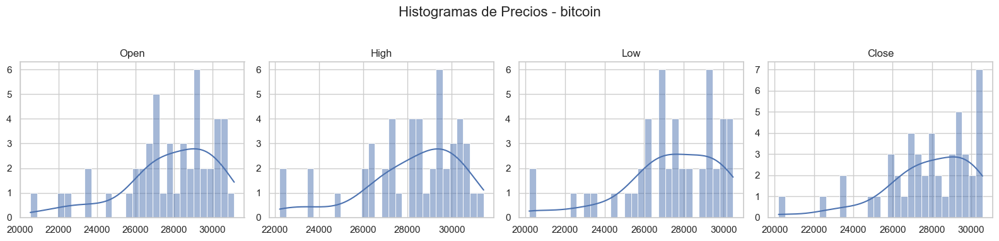

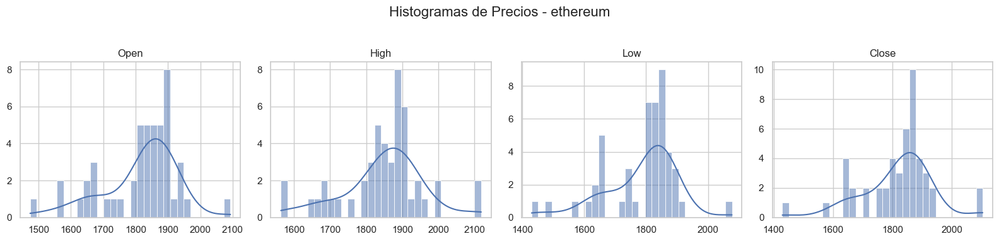

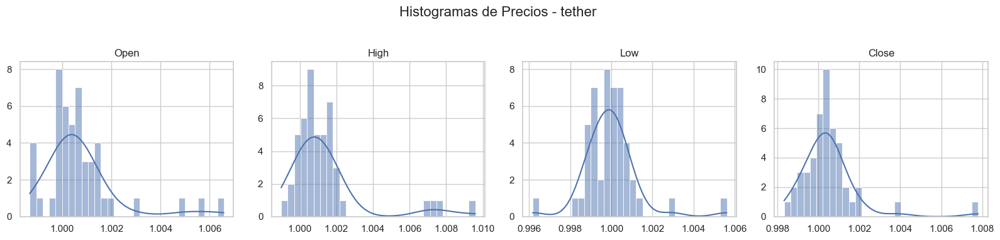

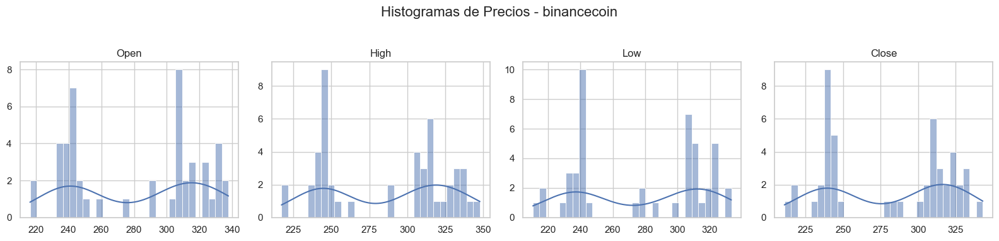

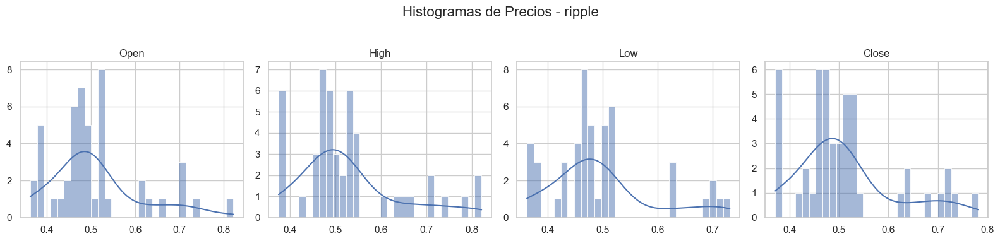

...

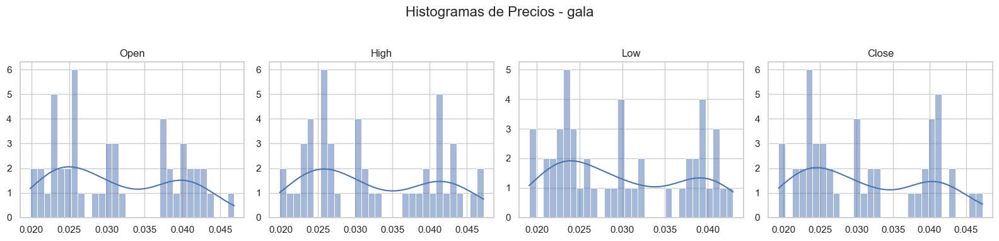

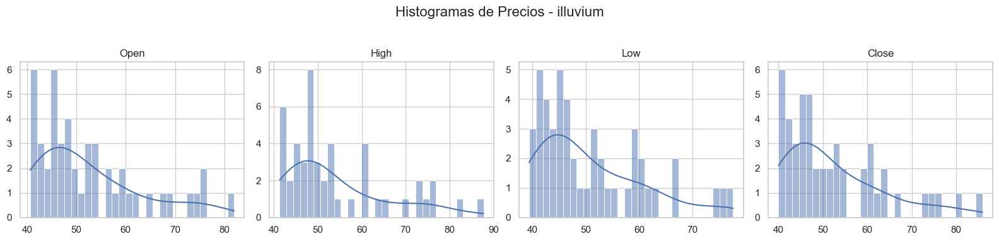

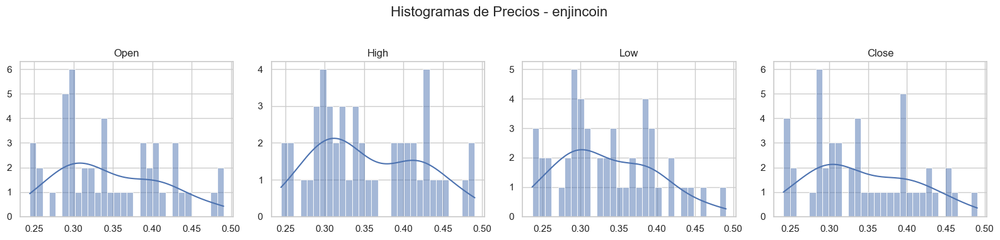

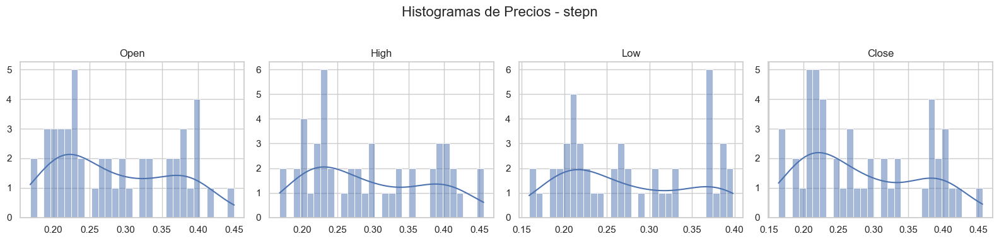

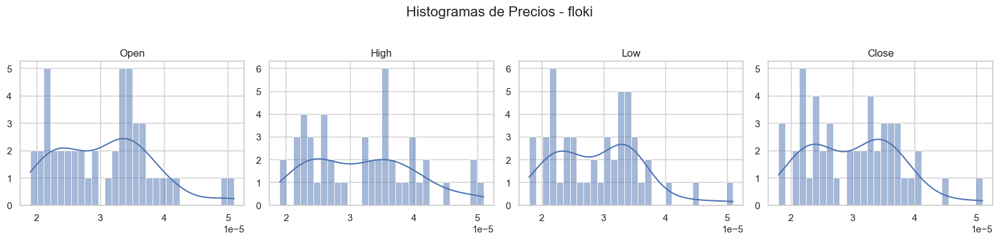

In [60]:
# Configurar el estilo de Seaborn
sns.set(style='whitegrid')

# Número de gráficos por fila
graphs_per_row = 4

# Calcular el número total de filas requeridas
total_rows = (len(combined_top_coins) + graphs_per_row - 1) // graphs_per_row

for i, crypto in enumerate(combined_top_coins):
    # Filtrar el DataFrame para la criptomoneda actual
    df_crypto_ohlc = df_ohlc[df_ohlc['Criptomoneda'] == crypto]

    # Crear subplots para cada columna
    fig, axes = plt.subplots(1, graphs_per_row, figsize=(16, 4))
    fig.suptitle(f'Histogramas de Precios - {crypto}', fontsize=16)

    # Iterar a través de las columnas y crear histogramas
    for j, col_ohlc in enumerate(columnas_ohlc):
        sns.histplot(df_crypto_ohlc[col_ohlc], ax=axes[j], kde=True, bins=30)
        axes[j].set_title(col_ohlc, fontsize=12)
        axes[j].set_xlabel('')
        axes[j].set_ylabel('')

    # Ajustar el espaciado entre subplots
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    # Mostrar los histogramas
    plt.show()


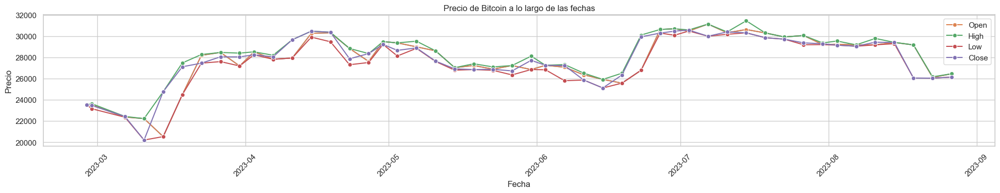

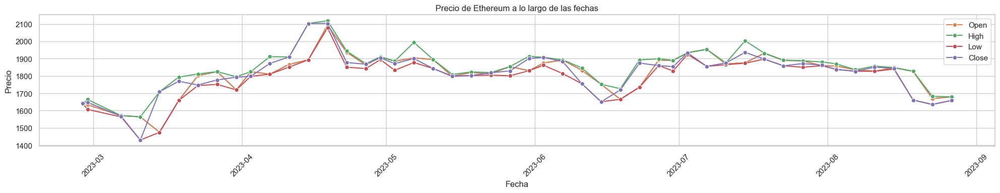

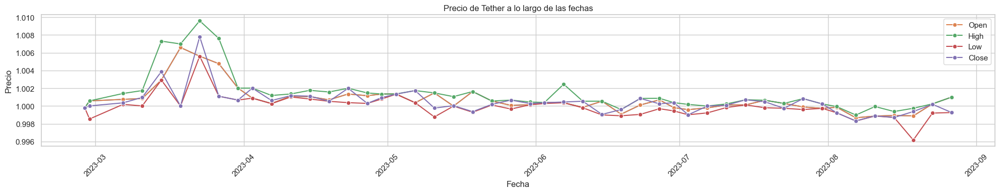

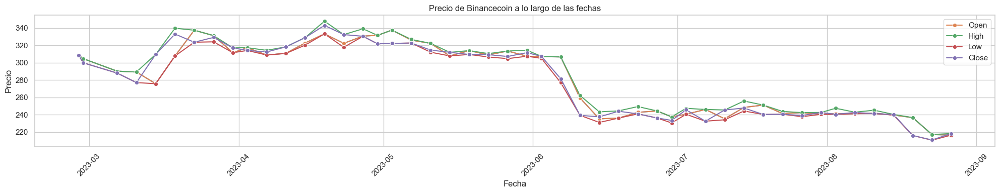

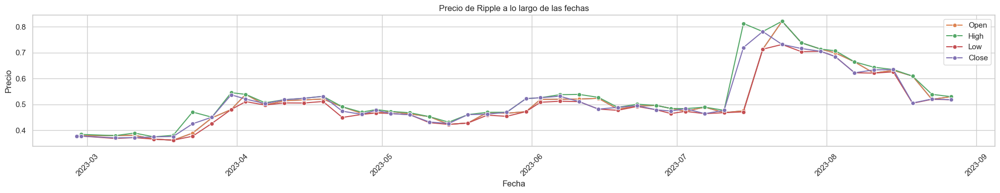

...

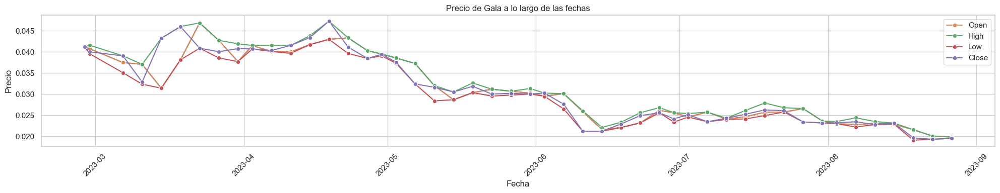

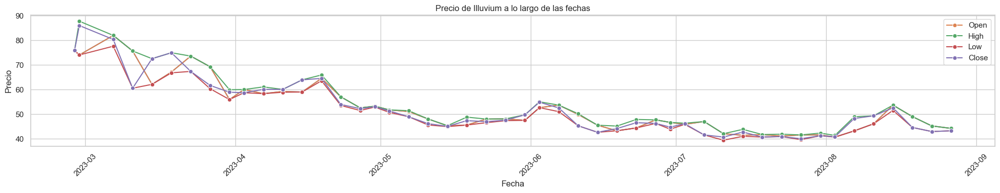

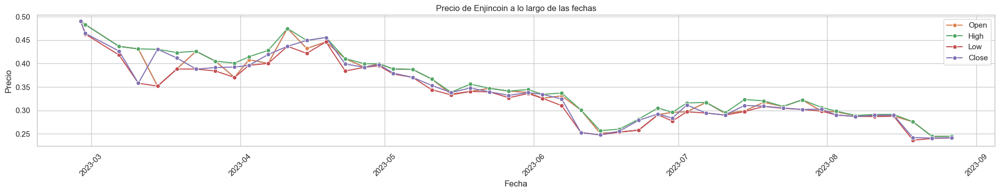

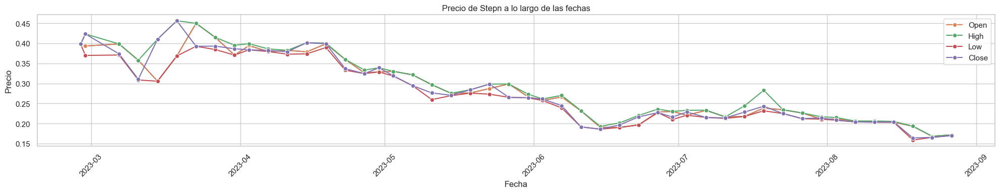

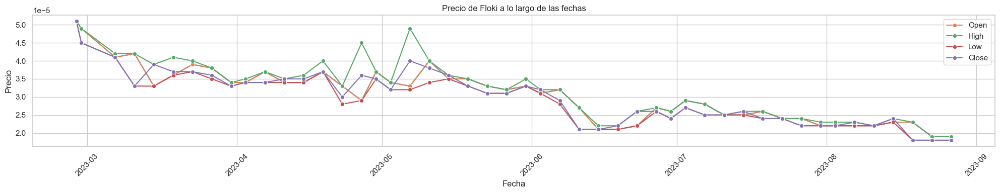

In [61]:
sns.set(style="whitegrid")

# Crear un gráfico por cada criptomoneda
#criptomonedas = df['Criptomoneda'].unique()
for cripto in combined_top_coins:
    plt.figure(figsize=(20, 4))
    df_cripto = df_ohlc[df_ohlc['Criptomoneda'] == cripto]
    sns.lineplot(x='Fecha', y='Open', data=df_cripto, marker='o')
    sns.lineplot(x='Fecha', y='Open', data=df_cripto, label='Open', marker='o')
    sns.lineplot(x='Fecha', y='High', data=df_cripto, label='High', marker='o')
    sns.lineplot(x='Fecha', y='Low', data=df_cripto, label='Low', marker='o')
    sns.lineplot(x='Fecha', y='Close', data=df_cripto, label='Close', marker='o')

    plt.title(f'Precio de {cripto.capitalize()} a lo largo de las fechas')
    plt.xlabel('Fecha')
    plt.ylabel('Precio')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


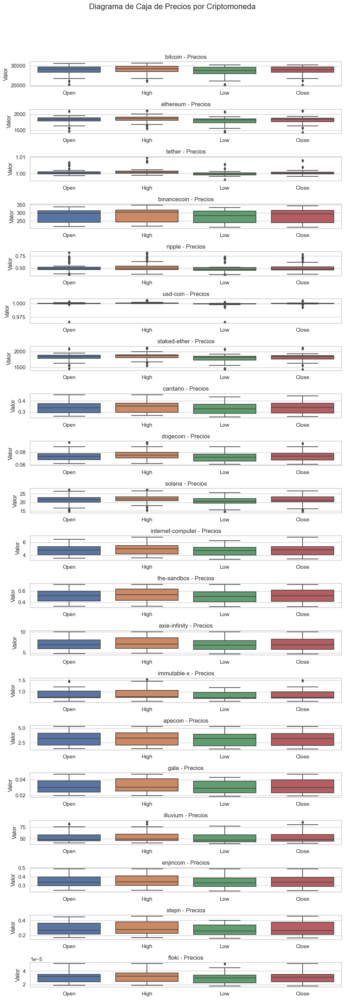

In [62]:
# Configurar el estilo de Seaborn
sns.set(style='whitegrid')

# Crear subplots para cada criptomoneda
fig, axes = plt.subplots(nrows=len(combined_top_coins), figsize=(10, 30))
fig.suptitle('Diagrama de Caja de Precios por Criptomoneda', fontsize=16)

# Iterar a través de las criptomonedas y crear diagramas de caja
for i, crypto in enumerate(combined_top_coins):
    # Filtrar el DataFrame para la criptomoneda actual
    df_crypto = df_ohlc[df_ohlc['Criptomoneda'] == crypto]
    
    # Crear el diagrama de caja para las columnas 'Open', 'High', 'Low' y 'Close'
    sns.boxplot(data=df_crypto[['Open', 'High', 'Low', 'Close']], ax=axes[i])
    axes[i].set_title(f'{crypto} - Precios', fontsize=12)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Valor')

# Ajustar el espaciado entre subplots
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Mostrar los diagramas de caja
plt.show()

In [63]:
columnas_ohlc

['Open', 'High', 'Low', 'Close']

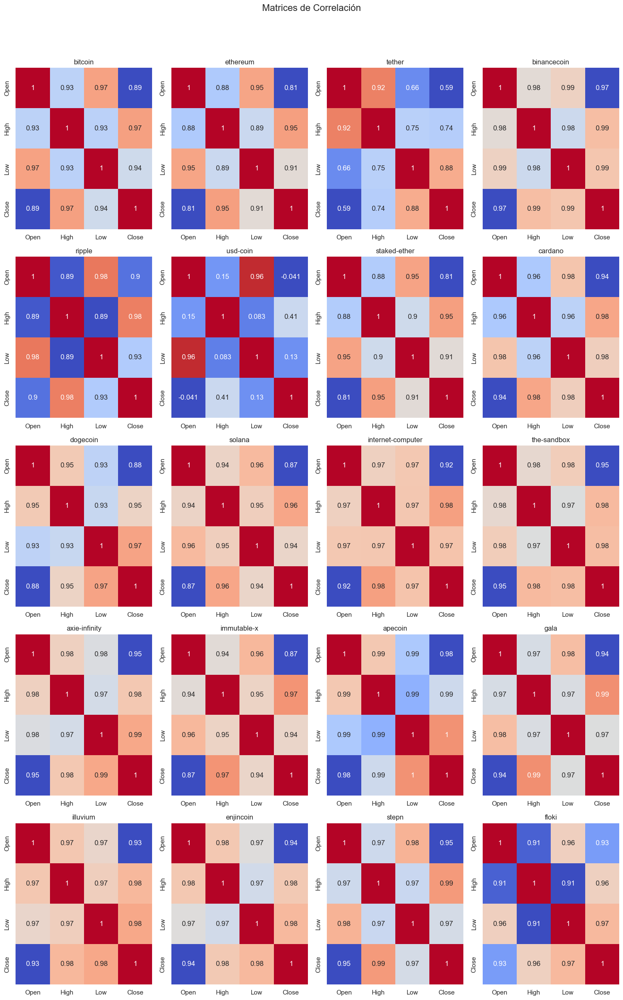

In [64]:
# Crear una lista vacía para almacenar las matrices de correlación
correlation_matrices = []

# Número de columnas por fila
columns_per_row = 4

# Calcular el número total de filas requeridas
total_rows = (len(combined_top_coins) + 3) // 4

# Crear una figura de matplotlib con subplots
fig, axes = plt.subplots(nrows=total_rows, ncols=columns_per_row, figsize=(15, 5 * total_rows))
fig.suptitle('Matrices de Correlación', fontsize=16)

# Aplanar la matriz de ejes para facilitar el acceso
axes = axes.flatten()

# Recorrer las criptomonedas en combined_top_coins
for i, cripto in enumerate(combined_top_coins):
    # Filtrar el DataFrame df_ohlc para la criptomoneda actual
    df_cripto = df_ohlc[df_ohlc['Criptomoneda'] == cripto]
    
    # Calcular la matriz de correlación para esta criptomoneda
    correlation_matrix = df_cripto[['Open', 'High', 'Low', 'Close']].corr()
    
    # Dibujar la matriz de correlación en el subplot correspondiente
    sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, cbar=False, ax=axes[i])
    
    # Establecer el título del subplot
    axes[i].set_title(cripto, fontsize=12)

# Eliminar los ejes vacíos si es necesario
if len(combined_top_coins) % 4 != 0:
    for j in range(len(combined_top_coins) % 4, 4):
        fig.delaxes(axes[-j])

# Ajustar el espaciado entre subplots
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Mostrar el gráfico
plt.show()


In [70]:
# Calcular el promedio, mínimo y máximo de volumen por criptomoneda y año
df_volumen = df.groupby(['Criptomoneda', 'Año']).agg({'Volumen': ['mean', 'min', 'max']}).reset_index()

# Renombrar las columnas
df_volumen.columns = ['Criptomoneda', 'Año', 'Promedio Volumen', 'Mínimo Volumen', 'Máximo Volumen']

# Guardar el DataFrame como un archivo CSV
df_volumen.to_csv('dataset/df_volumen.csv', index=False)

df_volumen

,Criptomoneda,Año,Promedio Volumen,Mínimo Volumen,Máximo Volumen
0,apecoin,2022,5.542387e+08,5.019747e+07,6.599176e+09
1,apecoin,2023,1.235505e+08,3.113385e+07,5.096739e+08
2,axie-infinity,2020,1.244981e+07,2.744359e+06,3.692590e+07
3,axie-infinity,2021,4.762675e+08,4.790388e+06,6.275445e+09
4,axie-infinity,2022,2.347826e+08,2.760766e+07,1.468648e+09
...,...,...,...,...,...
85,usd-coin,2019,1.582442e+09,4.330125e+06,6.655850e+09
86,usd-coin,2020,5.493799e+08,2.153194e+08,4.962064e+09
87,usd-coin,2021,2.710626e+09,1.017243e+09,1.015740e+10
88,usd-coin,2022,4.735661e+09,8.887580e+08,1.102918e+11


In [72]:
# Calcular el promedio, mínimo y máximo de mercado por criptomoneda y año
df_mercado = df.groupby(['Criptomoneda', 'Año']).agg({'Mercado': ['mean', 'min', 'max']}).reset_index()

# Renombrar las columnas
df_mercado.columns = ['Criptomoneda', 'Año', 'Promedio Mercado', 'Mínimo Mercado', 'Máximo Mercado']

# Guardar el DataFrame como un archivo CSV
df_mercado.to_csv('dataset/df_mercado.csv', index=False)

df_mercado

,Criptomoneda,Año,Promedio Mercado,Mínimo Mercado,Máximo Mercado
0,apecoin,2022,1.920390e+09,8.963721e+08,6.813397e+09
1,apecoin,2023,1.332834e+09,5.286914e+08,2.314914e+09
2,axie-infinity,2020,2.715023e+07,7.257185e+06,4.576155e+07
3,axie-infinity,2021,2.854757e+09,2.495752e+07,1.048598e+10
4,axie-infinity,2022,2.229942e+09,6.606498e+08,6.837245e+09
...,...,...,...,...,...
85,usd-coin,2019,3.726797e+08,2.321099e+08,5.263972e+08
86,usd-coin,2020,1.432756e+09,4.204296e+08,3.925840e+09
87,usd-coin,2021,2.253622e+10,4.123725e+09,4.266922e+10
88,usd-coin,2022,4.985986e+10,3.984492e+10,5.615979e+10


In [74]:
# Calcular el promedio, mínimo y máximo de precio por criptomoneda y año
df_precio = df.groupby(['Criptomoneda', 'Año']).agg({'Precio': ['mean', 'min', 'max']}).reset_index()

# Renombrar las columnas
df_precio.columns = ['Criptomoneda', 'Año', 'Promedio precio', 'Mínimo precio', 'Máximo precio']

# Guardar el DataFrame como un archivo CSV
df_precio.to_csv('dataset/df_precio.csv', index=False)

df_precio

,Criptomoneda,Año,Promedio precio,Mínimo precio,Máximo precio
0,apecoin,2022,6.670494,2.845311,23.628971
1,apecoin,2023,3.618240,1.436988,6.285254
2,axie-infinity,2020,0.492443,0.134893,0.823410
3,axie-infinity,2021,46.135197,0.451752,159.761222
4,axie-infinity,2022,28.111377,5.999914,96.642773
...,...,...,...,...,...
85,usd-coin,2019,1.001840,0.992090,1.029960
86,usd-coin,2020,0.999728,0.990259,1.007384
87,usd-coin,2021,1.000991,0.980894,1.010989
88,usd-coin,2022,1.000589,0.987916,1.010925
